In [1]:
# General modules
import sys
import os
import session_info
import warnings
from pyprojroot.here import here
import glob
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.lines as plines
import matplotlib.colors as mcolors
from IPython.display import display
from matplotlib.backends.backend_pdf import PdfPages
from matplotlib.lines import Line2D  # for legend handle

# Specific modules
import scanpy as sc
import decoupler as dc
import anndata as ad
#import scienceplots
import pickle

# Setting some parameters
warnings.filterwarnings("ignore")

# Import functions
sys.path.insert(1, str(here('bin')))
from customPalette import *
from customPythonFunctions import mean_by_category, filter_low_represented_cell_group, RelativeDiff_mean_by_category, mscatter

#plt.style.use(['nature'])
dpi_fig_save = 300
sc.set_figure_params(dpi=100, dpi_save=dpi_fig_save, vector_friendly=True)

overwriteFigures = True
overwriteData = True

pd.options.display.max_columns = 300
pd.options.display.max_rows = 1000

In [2]:
print("Main directory path: {}".format(here()))

Main directory path: /scratch_isilon/groups/singlecell/shared/projects/Inflammation-PBMCs-Atlas


# Load data

**Load GeneSets**

In [3]:
# V1 signatures
v1_GeneSets = pd.read_csv('/scratch_isilon/groups/singlecell/shared/projects/Inflammation-PBMCs-Atlas/external_reference_data/human_immune-specific_signature-genes.csv')
v1_signatures_dict = {}
# Iterate over each column in the DataFrame
for column in v1_GeneSets.columns:
    # Convert the column to a dictionary and assign it to the corresponding key
    v1_signatures_dict[column] = [value for value in v1_GeneSets[column].to_list() if pd.notna(value)]

In [4]:
varDF = pd.read_csv(here('03_downstream_analysis/05_SPECTRA/results/varDF.csv'), index_col=0)
varDF = varDF.drop(['hgnc_id', 'locus_group', 'HUGO_status', 'mt', 'ribo', 'hb', 'plt'], axis=1)
varDF.head()
symbol_to_ensg_dict = varDF['symbol'].to_dict()
symbol_to_ensg_dict = {v: k for k, v in symbol_to_ensg_dict.items()}

In [5]:
v1_signatures_ensg = {}
for key, values in v1_signatures_dict.items():
    # Filter out values not present in symbol_to_ensg_dict
    updated_values = [symbol_to_ensg_dict[value] for value in values if value in symbol_to_ensg_dict]
    # Update the dictionary with the filtered values
    v1_signatures_ensg[key] = updated_values

In [6]:
# Spectra signatures
with open(here('03_downstream_analysis/05_SPECTRA/results/SPECTRA_GeneSet_ensg_v2.pickle'), 'rb') as f:
    spectra_gene_sets = pickle.load(f)

In [7]:
# V2 signatures
celltype = "B"
v2_signatures_dict = {}
for key in spectra_gene_sets[celltype]:
    if f"{celltype}_" in key:
        new_key = key.replace(f"{celltype}_", "")
        v2_signatures_dict[new_key] = spectra_gene_sets[celltype][key]

**Load Factors**

In [8]:
spectra_Factors = pd.read_csv(here('03_downstream_analysis/05_SPECTRA/results/SPECTRAFactor_Processed_LAM0.001_S0.6_NonCellIdentitymarkersDF.csv'), 
                          index_col=0)
print(spectra_Factors.shape)
spectra_Factors.head()
                              

(935, 125)


,0-X-global-X-global_all_IL6-JAK-STAT3_signaling,1-X-global-X-B_IFN_Type_1_2_Lambda,2-X-global-X-global_all_type-I and II-ifn-response,3-X-global-X-global_all_TNF-via-NFkB_signaling,4-X-global-X-global_all_MHC-II-I presentation,5-X-global-X-global_all_complement_production,7-X-B-X-effector,8-X-B-X-B_chemokines,9-X-B-X-Plasma_chemokine_receptors,10-X-B-X-UTC_cytokine_and_receptors_proinflammatory,11-X-B-X-T_CD4_Naive_cytokine_and receptors_ antiinflammatory,12-X-B-X-ILC_IFN_Type_1_2_Lambda,13-X-B-X-Mono_IFN_response,14-X-B-X-T_CD8_NonNaive_TNF_receptors_ligands,15-X-B-X-T_CD4_NonNaive_adhesion_molecules,16-X-B-X-T_CD8_NonNaive_antigen_presentation_molecules,18-X-DC-X-DC_antigen-crosspresentation,19-X-DC-X-T_CD8_Naive_chemokines,20-X-DC-X-T_CD4_NonNaive_chemokine_receptors,21-X-DC-X-UTC_cytokine_and_receptors_proinflammatory,22-X-DC-X-cDC_cytokine_and receptors_ antiinflammatory,23-X-DC-X-T_CD8_Naive_IFN_Type_1_2_Lambda,24-X-DC-X-ILC_IFN_response,25-X-DC-X-T_CD8_NonNaive_TNF_receptors_ligands,26-X-DC-X-ILC_adhesion_molecules,27-X-DC-X-T_CD4_NonNaive_antigen_presentation_molecules,28-X-DC-X-28,29-X-ILC-X-T_CD4_Naive_chemokines,30-X-ILC-X-T_CD4_Naive_chemokine_receptors,31-X-ILC-X-pDC_cytokine_and_receptors_proinflammatory,32-X-ILC-X-cDC_cytokine_and receptors_ antiinflammatory,33-X-ILC-X-T_CD4_Naive_IFN_Type_1_2_Lambda,34-X-ILC-X-Mono_IFN_response,35-X-ILC-X-T_CD8_NonNaive_TNF_receptors_ligands,36-X-ILC-X-Mono_adhesion_molecules,37-X-ILC-X-ILC_antigen_presentation_molecules,39-X-Mono-X-IFNG_response,40-X-Mono-X-IL4-IL13_response,41-X-Mono-X-T_CD8_Naive_chemokines,42-X-Mono-X-ILC_chemokine_receptors,43-X-Mono-X-pDC_cytokine_and_receptors_proinflammatory,44-X-Mono-X-cDC_cytokine_and receptors_ antiinflammatory,45-X-Mono-X-UTC_IFN_Type_1_2_Lambda,46-X-Mono-X-T_CD4_Naive_IFN_response,47-X-Mono-X-T_CD8_NonNaive_TNF_receptors_ligands,48-X-Mono-X-T_CD4_NonNaive_adhesion_molecules,49-X-Mono-X-T_CD4_NonNaive_antigen_presentation_molecules,50-X-Mono-X-50,51-X-Plasma-X-T_CD4_NonNaive_chemokines,52-X-Plasma-X-B_chemokine_receptors,53-X-Plasma-X-pDC_cytokine_and_receptors_proinflammatory,54-X-Plasma-X-Plasma_cytokine_and receptors_ antiinflammatory,55-X-Plasma-X-Plasma_IFN_Type_1_2_Lambda,56-X-Plasma-X-pDC_IFN_response,57-X-Plasma-X-T_CD8_NonNaive_TNF_receptors_ligands,58-X-Plasma-X-Mono_adhesion_molecules,59-X-Plasma-X-UTC_antigen_presentation_molecules,61-X-T_CD4_Naive-X-T_CD4_Naive_CD4T_TH17_UP,62-X-T_CD4_Naive-X-T_CD4_NonNaive_CD4T_TH2_UP,63-X-T_CD4_Naive-X-T_CD4_Naive_CD4T_TFH_UP,64-X-T_CD4_Naive-X-T_CD4_NonNaive_CD4T_TH1_UP,65-X-T_CD4_Naive-X-T_CD4_NonNaive_Tregs_FoxP3_stabilization,66-X-T_CD4_Naive-X-Mono_chemokines,67-X-T_CD4_Naive-X-cDC_chemokine_receptors,68-X-T_CD4_Naive-X-pDC_cytokine_and_receptors_proinflammatory,69-X-T_CD4_Naive-X-pDC_cytokine_and receptors_ antiinflammatory,70-X-T_CD4_Naive-X-T_CD4_NonNaive_IFN_Type_1_2_Lambda,71-X-T_CD4_Naive-X-UTC_IFN_response,72-X-T_CD4_Naive-X-T_CD8_NonNaive_TNF_receptors_ligands,73-X-T_CD4_Naive-X-T_CD8_NonNaive_adhesion_molecules,74-X-T_CD4_Naive-X-T_CD8_NonNaive_antigen_presentation_molecules,76-X-T_CD4_NonNaive-X-T_CD4_Naive_CD4T_TH17_UP,77-X-T_CD4_NonNaive-X-T_CD4_NonNaive_CD4T_TH2_UP,78-X-T_CD4_NonNaive-X-T_CD4_NonNaive_CD4T_TFH_UP,79-X-T_CD4_NonNaive-X-T_CD4_Naive_CD4T_TH1_UP,80-X-T_CD4_NonNaive-X-T_CD4_NonNaive_Tregs_FoxP3_stabilization,81-X-T_CD4_NonNaive-X-T_CD8_NonNaive_chemokines,82-X-T_CD4_NonNaive-X-Plasma_chemokine_receptors,83-X-T_CD4_NonNaive-X-T_CD4_Naive_cytokine_and_receptors_proinflammatory,84-X-T_CD4_NonNaive-X-Mono_cytokine_and receptors_ antiinflammatory,85-X-T_CD4_NonNaive-X-B_IFN_Type_1_2_Lambda,86-X-T_CD4_NonNaive-X-T_CD4_Naive_IFN_response,87-X-T_CD4_NonNaive-X-T_CD8_NonNaive_TNF_receptors_ligands,88-X-T_CD4_NonNaive-X-cDC_adhesion_molecules,89-X-T_CD4_NonNaive-X-pDC_antigen_presentation_molecules,91-X-T_CD8_Naive-X-T_CD8_NonNaive_CD8T_exhaustion,92-X-T_CD8_Naive-X-T_CD8_Naive_CD8T_tcr_activation,93-X-T_CD8_Naive-X-Plasma_chemokines,94-X-T_CD8_Naive-X-UTC_chemoki

In [9]:
v2_factors = {}
for column in spectra_Factors.columns:
    # Collect the indices where the value is True for the current column
    true_indices = spectra_Factors.index[spectra_Factors[column]].tolist()
    # Add the column name and corresponding indices to the dictionary
    v2_factors[column] = true_indices

**Load objects with signatures**

In [10]:
cts_adata = {}
for celltype in ['B', 'Plasma', 'pDC', 'DC', 'Mono', 'T_CD4_Naive', 'T_CD4_NonNaive', 'T_CD8_Naive', 'T_CD8_NonNaive', 'UTC','ILC', 
                 #'Cycling_cells', 'Progenitors'
                ]:
#for celltype in ["ILC", "Mono", 'B', 'T_CD4_NonNaive', 'T_CD8_NonNaive', 'Plasma','pDC', 'DC']:
    print(celltype)
    inputfile_path = here('03_downstream_analysis/06_inflammation_signatures/results/DecoupleR_ulmestimates_{}.h5ad'.format(celltype))
    # Loading scanpy (Anndata) object
    adata_cell = sc.read_h5ad(inputfile_path)   
    cts_adata[celltype] = adata_cell

B
Plasma
pDC
DC
Mono
T_CD4_Naive
T_CD4_NonNaive
T_CD8_Naive
T_CD8_NonNaive
UTC
ILC


# Analyse IFN-response overlap accross GeneSets 

**Define IFN-response dictionary**

In [11]:
signature = 'IFN_response'

In [12]:
v1_IFNr = v1_signatures_ensg[signature]
v2_IFNr = v2_signatures_dict[signature]

In [13]:
IFN_gs = {}
for key, value in v2_factors.items():
    if signature in key:
        split_key = key.split('-X-')
        new_key = split_key[0] + "_" + split_key[1]
        IFN_gs[new_key] = value
#IFN_gs["v1_signatures"] = v1_IFNr
IFN_gs["v2_signatures"] = v2_IFNr

In [14]:
IFN_gs.keys()

dict_keys(['13_B', '24_DC', '34_ILC', '46_Mono', '56_Plasma', '71_T_CD4_Naive', '86_T_CD4_NonNaive', '98_T_CD8_Naive', '110_T_CD8_NonNaive', '120_UTC', '130_pDC', 'v2_signatures'])

**Plot results**

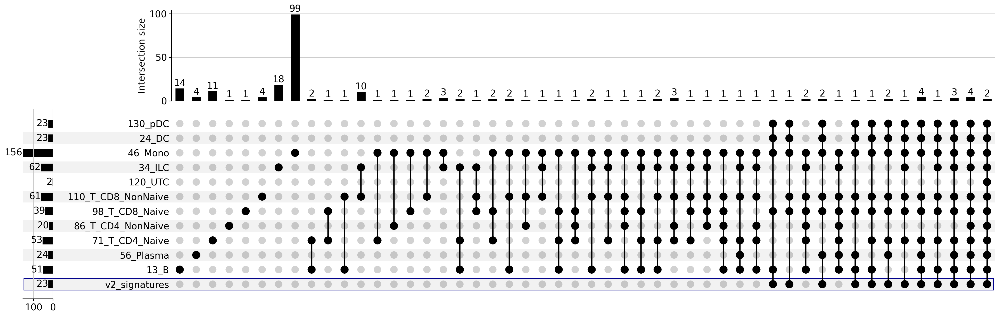

In [15]:
from collections import OrderedDict
from upsetplot import UpSet
from upsetplot import from_contents
set_order = [#"v1_signatures", 
             "v2_signatures",
             "13_B", "56_Plasma",
             "71_T_CD4_Naive", "86_T_CD4_NonNaive",
             "98_T_CD8_Naive", "110_T_CD8_NonNaive",
             "120_UTC", "34_ILC",
             "46_Mono", "24_DC",  "130_pDC"           
            ]
IFN_gs_ordered = OrderedDict((key, IFN_gs[key]) for key in set_order)

res = from_contents(IFN_gs_ordered)
upset = UpSet(res, 
              subset_size = "count",
              show_counts=True, 
             sort_categories_by = "input")
upset.style_categories("v1_signatures", shading_edgecolor="darkgreen", shading_linewidth=1)
upset.style_categories("v2_signatures", shading_edgecolor="darkblue", shading_linewidth=1)
upset


# SLE

## Generate Metadata

### Perez2022

In [27]:
with open(here("00_data_processing/results/study_metadata/Perez2022_patient_metadata.pkl"), 'rb') as file:
    Perez_data = pickle.load(file)

In [28]:
Perez_data.head()

,patientID,timepoint_replicate,old_sample_id,age,sex,disease,diseaseStatus,ethnicity
sampleID,,,,,,,,
Perez2022_1760_T0,Perez2022_1760,0,1760,30.0,Female,SLE,Managed,European
Perez2022_1584_T0,Perez2022_1584,0,1584,62.0,Female,SLE,Managed,Asian
Perez2022_1775_T0,Perez2022_1775,0,1775,37.0,Female,SLE,Managed,European
Perez2022_1811_T0,Perez2022_1811,0,1811,56.0,Female,SLE,Managed,European
Perez2022_1785_T0,Perez2022_1785,0,1785,56.0,Female,SLE,Managed,European


In [29]:
Perez_data.timepoint_replicate.value_counts()

0    261
1     11
2      2
Name: timepoint_replicate, dtype: int64

In [30]:
def categorize_disease(row):
    if row["disease"] == "SLE" and "FLARE" in row.name:
        return "FLARE"
    elif row["disease"] == "SLE":
        return "SLE"
    elif row["disease"] == "Healthy":
        return "Healthy"
Perez_data["diseaseCategory"] = Perez_data.apply(categorize_disease, axis=1)
Perez_data["diseaseCategory"].value_counts()

SLE        154
Healthy     99
FLARE       21
Name: diseaseCategory, dtype: int64

In [31]:
Perez_data[Perez_data["timepoint_replicate"] == 0]["diseaseCategory"].value_counts()

SLE        148
Healthy     99
FLARE       14
Name: diseaseCategory, dtype: int64

#### Generate DF for FLARE-samples

In [32]:
Flare_DF = Perez_data[Perez_data.index.str.contains("FLARE")]
Flare_samples = Flare_DF.index.tolist()
Flare_samplesT0 = [sample_id for sample_id in Flare_samples if not sample_id.endswith("T1")]
Flare_samplesT0

['Perez2022_FLARE005_T0',
 'Perez2022_FLARE006_T0',
 'Perez2022_FLARE015_T0',
 'Perez2022_FLARE007_T0',
 'Perez2022_FLARE001_T0',
 'Perez2022_FLARE014_T0',
 'Perez2022_FLARE009_T0',
 'Perez2022_FLARE004_T0',
 'Perez2022_FLARE013_T0',
 'Perez2022_FLARE020_T0',
 'Perez2022_FLARE010_T0',
 'Perez2022_FLARE017_T0',
 'Perez2022_FLARE016_T0',
 'Perez2022_FLARE011_T0']

In [33]:
Perez_flare = pd.DataFrame({
    "sampleID": Flare_samplesT0,
    "SLEDAI_score": np.nan,
    "Flare": "F"
})

In [34]:
Perez_flare.head()

,sampleID,SLEDAI_score,Flare
0,Perez2022_FLARE005_T0,NaN,F
1,Perez2022_FLARE006_T0,NaN,F
2,Perez2022_FLARE015_T0,NaN,F
3,Perez2022_FLARE007_T0,NaN,F
4,Perez2022_FLARE001_T0,NaN,F


#### Generate DF for NonFlare-samples

In [35]:
file_path = here('00_data_processing/datasets/public_data_unprocessed/Perez_Science_2022__SLE-HC/Clinical_Variables_Science.xlsx')
Perez_clinical_data = pd.read_excel(file_path)
#Perez_clinical_data = Perez_clinical_data.set_index('genotypeid')
Perez_clinical_data.head()

,genotypeid,X,subjectid,female,age,steroralnow,cellceptnow,plaquenilnow,sledaiscore,kidney,acranac,acrantidsdna,acrantismith,acrleukopenia,sledailowcomp,acrmalar,acrrenalc,acrneurologc,acrarthritisc,acrmuculcers,acrserositisc,acrthrombocyto,acrdiscoid,acrphotosensitiv,acrapla,acrlymphopenia,raceethdesc,raceeth,agedx
0,1004_1004,2,1004,1,39,0.0,NaN,1.0,2,0.0,1,0,0,0,1,0,0,1,1,1,1,1,0,0,0,1,HISPANIC,2.0,24
1,1014_1014,5,1014,1,40,1.0,NaN,1.0,2,1.0,1,1,0,0,0,1,1,0,1,0,0,0,0,1,0,0,WHITE,1.0,27
2,1019_1019,9,1019,1,64,NaN,NaN,1.0,0,0.0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,WHITE,1.0,30
3,1022_1022,10,1022,1,56,0.0,1.0,1.0,2,0.0,1,1,0,0,1,1,0,0,1,1,1,0,1,1,1,0,HISPANIC,2.0,39
4,1031_1031,15,1031,1,32,1.0,NaN,1.0,2,0.0,1,1,0,0,0,1,0,0,1,0,1,1,0,1,0,0,ASIAN,4.0,21


In [36]:
Perez_clinical_data.shape

(146, 29)

In [37]:
Perez_clinical_data["sampleID"] = "Perez2022_" + Perez_clinical_data["subjectid"].astype(str) + "_T0"

In [38]:
Perez_SLEDAI = Perez_clinical_data[["sampleID", "sledaiscore"]]
Perez_SLEDAI.columns = ["sampleID", "SLEDAI_score"]
Perez_SLEDAI["Flare"] = "notF"
Perez_SLEDAI.head()

,sampleID,SLEDAI_score,Flare
0,Perez2022_1004_T0,2,notF
1,Perez2022_1014_T0,2,notF
2,Perez2022_1019_T0,0,notF
3,Perez2022_1022_T0,2,notF
4,Perez2022_1031_T0,2,notF


In [39]:
Perez_SLE = pd.concat([Perez_SLEDAI, Perez_flare], ignore_index=True)

In [40]:
Perez_SLE.head()

,sampleID,SLEDAI_score,Flare
0,Perez2022_1004_T0,2.0,notF
1,Perez2022_1014_T0,2.0,notF
2,Perez2022_1019_T0,0.0,notF
3,Perez2022_1022_T0,2.0,notF
4,Perez2022_1031_T0,2.0,notF


In [41]:
Perez_SLE.shape

(160, 3)

In [42]:
# Two SLE samples not present in Excel provided by authors
missing_samples = [index for index in Perez_data.index if index not in Perez_SLEDAI["sampleID"].values]
filt_missing_samples = [
    index for index in missing_samples
    if index.endswith("T0") and not any(substring in index for substring in ["FLARE", "IGTB", "HC", "ICC"])
]
filt_missing_samples

['Perez2022_2132_T0', 'Perez2022_1586_T0']

In [43]:
missing_samples_df = pd.DataFrame({
    "sampleID": filt_missing_samples,
    "SLEDAI_score": np.nan,
    "Flare": "not_F"
})

Perez_SLE = pd.concat([Perez_SLE, missing_samples_df], ignore_index=True)
Perez_SLE.shape

(162, 3)

In [44]:
Perez_SLE["Responder"] = np.nan
Perez_SLE["studyID"] = "Perez2022"

In [45]:
Perez_SLE.head()

,sampleID,SLEDAI_score,Flare,Responder,studyID
0,Perez2022_1004_T0,2.0,notF,NaN,Perez2022
1,Perez2022_1014_T0,2.0,notF,NaN,Perez2022
2,Perez2022_1019_T0,0.0,notF,NaN,Perez2022
3,Perez2022_1022_T0,2.0,notF,NaN,Perez2022
4,Perez2022_1031_T0,2.0,notF,NaN,Perez2022


### CNAG-SLE (SCGT00) metadata

In [46]:
with open(here('00_data_processing/results/study_metadata/SCGT00_patient_metadata.pkl'), 'rb') as file:
    SCG_data = pickle.load(file)

In [47]:
SLE_SCG_data = SCG_data[(SCG_data['disease'] == 'SLE')]
SLE_SCG_data.shape

(16, 10)

In [48]:
SLE_SCG_data

,patientID,timepoint_replicate,old_sample_id,disease,treatmentStatus,therapyResponse,sex,age,BMI,smokingStatus
sampleID,,,,,,,,,,
SCGT00_I0149.3P_T0,SCGT00_I0149,0,I014-00009,SLE,AntiBlyS/BAFF,R,Female,43.0,23.3843537414966,non-smoker
SCGT00_I0141.3P_T0,SCGT00_I0141,0,I014-00001,SLE,AntiBlyS/BAFF,NR,Female,23.0,20.077747874749,non-smoker
SCGT00_I0145.3P_T0,SCGT00_I0145,0,I014-00005,SLE,AntiBlyS/BAFF,NR,Female,28.0,18.1662042541947,non-smoker
SCGT00_I0148.3P_T0,SCGT00_I0148,0,I014-00008,SLE,AntiBlyS/BAFF,R,Female,36.0,25.390625,smoker
SCGT00_I0143.3P_T0,SCGT00_I0143,0,I014-00003,SLE,AntiBlyS/BAFF,NR,Female,43.0,29.3480257116621,non-smoker
SCGT00_I0144.3P_T0,SCGT00_I0144,0,I014-00004,SLE,AntiBlyS/BAFF,R,Female,29.0,38.257130106698,non-smoker
SCGT00_I014011.3P_T0,SCGT00_I014011,0,I014-00011,SLE,AntiBlyS/BAFF,R,Female,62.0,28.8888888888889,non-smoker
SCGT00_I0142.3P_T0,SCGT00_I0142,0,I014-00002,SLE,AntiBlyS/BAFF,NR,Female,57.0,20.5761316872428,non-smoker
SCGT00_I0146.3P_T0,SCGT00_I0146,0,I014-00006,SLE,AntiBlyS/BAFF,NR,Female,42.0,27.4348422496571,non-smoker


In [49]:
SCG_obs_extended = pd.read_csv(here('00_data_processing/results/extended_obs/SCGT00_LE_Anti-BLyS_BAFF_clinicalData.tsv'), sep='\t')

In [50]:
SCG_obs_extended

,donor.ID.scRNASeq,sample.ID.basalWeek.scRNASeq,sample.ID.ResponseWeek.scRNASeq,donor.ID.GWAS,sample.ID.GWAS,donor.ID.RNASeq,sample.ID.basalWeek.RNASeq,sample.ID.ResponseWeek.RNASeq,donor.ID.Proteomics,sample.ID.Proteomics,Response,Disease,Week.basalWeek,Date.basalWeek,Week.ResponseWeek,Nominal.ResponseWeek,Date.ResponseWeek,ACT.basalWeek,ACT.ResponseWeek,Drug,Target,PersonalInformation.Sex,Birth.Donor.PresentAgeDonor,PersonalInformation.Height,PersonalInformation.Weight,DerivedBMI,TobaccoFrequency.CigarettesFrequency,TobaccoFrequency.CigarsFrequency,TobaccoFrequency.SmokingPipeFrequency,TypeOfTobacco.DailyCigaretteQuantity,Dyslipidemia,Angor,HBP,AMI,T2DM,Stroke,Neoplasia,Claudication,NoBiologicalTreatment.Corticosteroids,Collection.YearsOfEvolution,concomitant.treatments.GC,TranscurredDays
0,I014-00001,I014B00001,I014B00002,I015-00025,I015D00025,I016-00114,I016P00222,I016P00223,I023-00139,I023E00037,NR,LE,S0,2015-05-27,S16,21,2015-10-21,6.00,4.00,Belimumab,Anti BLyS/BAFF,Female,23.000000,153,47.0,20.077748,Never,Never,Never,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Yes,23.4,True,147
1,I014-00014,I014B00027,I014B00028,I015-00038,I015D00038,I016-00043,I016P00084,I016P00085,I023-00140,I023E00034,NR,LE,S0,2022-02-24,S16,10,2022-05-10,8.00,8.00,Belimumab,Anti BLyS/BAFF,Female,46.000000,160,55.0,21.484375,Never,Never,Never,NaN,Yes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Yes,45.4,True,75
2,I014-00004,I014B00008,I014B00007,I015-00028,I015D00028,I016-00075,I016P00147,I016P00148,I023-00141,I023E00027,R,LE,S0,2021-05-26,SRM,13,2021-08-26,7.00,0.00,Belimumab,Anti BLyS/BAFF,Female,29.000000,157,94.3,38.257130,Never,Never,Never,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Yes,29.5,True,92
3,I014-00008,I014B00015,I014B00016,I015-00032,I015D00032,I016-00084,I016P00164,I016P00165,I023-00142,I023E00057,R,LE,S0,2021-07-28,SRM,13,2021-10-27,8.00,4.00,Belimumab,Anti BLyS/BAFF,Female,36.000000,160,65.0,25.390625,Daily,Never,Never,1 to 10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Yes,36.7,True,91
4,I014-00011,I014B00021,I014B00022,I015-00035,I015D00035,I016-00096,I016P00186,I016P00187,I023-00143,I023E00008,R,LE,S0,2022-01-18,S16,10,2022-03-29,9.00,4.00,Belimumab,Anti BLyS/BAFF,Female,62.000000,150,65.0,28.888889,Never,Never,Never,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,62.1,False,70
5,I014-00009,I014B00017,I014B00018,I015-00033,I015D00033,I016-00005,I016P00009,I016P00010,I023-00144,I023E00060,R,LE,S0,2021-11-16,S16,12,2022-02-09,10.00,4.00,Belimumab,Anti BLyS/BAFF,Female,43.000000,168,66.0,23.384354,Never,Never,Never,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Yes,44.0,True,85
6,I014-00016,I014B00031,I014B00032,I015-00040,I015D00040,I016-00063,I016P00123,I016P00124,I023-00145,I023E00025,R,LE,S0,2022-03-04,S16,13,2022-06-07,11.00,0.00,Belimumab,Anti BLyS/BAFF,Female,24.000000,166,59.0,21.410945,Never,Never,Never,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23.9,False,95
7,I014-00003,I014B00005,I014B00006,I015-00027,I015D00027,I016-00088,I016P00172,I016P00173,I023-00146,I023E00047,NR,LE,S0,2021-05-11,S16,14,2021-08-20,5.00,9.00,Belimumab,Anti BLyS/BAFF,Female,43.000000,165,79.9,29.348026,Never,Never,Never,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,43.9,False,101
8,I014-00006,I014B00011,I014B00012,I015-00030,I015D00030,I016-00062,I016P00121,I016P00122,I023-00147,I023E00006,NR,LE,S0,2021-06-18,S16,13,2021-09-17,4.00,2.00,Belimumab,Anti BLyS/BAFF,Female,42.000000,162,72.0,27.434842,Never,Never,Never,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Yes,42.9,True,91
9,I014-00013,I014B00025,I014B00026,I015-00037,I015D00037,I016-00035,I016P00068,I016P00069,I023-00148,I023E00013,R,LE,S0,2022-02-02,S16,10,2022-04-13,10.00,6.00,Belimumab,Anti BLyS/BAFF,Female,28.000000,170,69.4,24.013841,Never,Never,Never,NaN,NaN,NaN,Yes,NaN,NaN,NaN,NaN,NaN,Yes,28.9,True,70


In [51]:
SCG_obs_extended.shape

(16, 42)

In [52]:
import numpy as np

# Function to normalize age values
def normalize_age(age):
    try:
        return float(age)
    except ValueError:
        return np.nan

# Initialize an empty dictionary to store mappings
patient_mapping = {}

# Iterate through each row in SCG_data
for idx, row_data in SLE_SCG_data.iterrows():
    # Extract sex, age, and BMI from SCG_data
    sex = row_data['sex']
    age = normalize_age(row_data['age'])
    #BMI = row_data['BMI']
    
    # Find corresponding row in SCG_obs_extended based on sex, age, and BMI
    match = SCG_obs_extended[
        (SCG_obs_extended['PersonalInformation.Sex'] == sex) &
        (np.abs(SCG_obs_extended['Birth.Donor.PresentAgeDonor'] - age) < 0.5) #&  # Adjust tolerance as needed
        #(SCG_obs_extended['DerivedBMI'] == BMI)
    ]
    
    # Check if there's exactly one match
    if len(match) == 1:
        # Store mapping
        patient_mapping[match.index[0]] = row_data['patientID']
    elif len(match) > 1:
        # Handle multiple matches (if necessary)
        patient_mapping[match.index[0]] = 'Multimapping'
    else:
        # Handle no match
        patient_mapping[row_data['patientID']] = 'NotFound'

# Display the dictionary
print(patient_mapping)


{5: 'Multimapping', 0: 'SCGT00_I0141', 9: 'Multimapping', 3: 'SCGT00_I0148', 2: 'SCGT00_I0144', 4: 'SCGT00_I014011', 11: 'SCGT00_I0142', 8: 'SCGT00_I0146', 14: 'SCGT00_I014010', 13: 'SCGT00_I014015', 12: 'SCGT00_I0147', 1: 'SCGT00_I014014', 6: 'SCGT00_I014016', 10: 'SCGT00_I014012'}


In [53]:
patient_mapping = {}
patient_mapping[0] = "SCGT00_I0141"
patient_mapping[1] = "SCGT00_I014014"
patient_mapping[2] = "SCGT00_I0144"
patient_mapping[3] = "SCGT00_I0148"
patient_mapping[4] = "SCGT00_I014011"
patient_mapping[5] = "SCGT00_I0149"
patient_mapping[6] = "SCGT00_I014016"
patient_mapping[7] = "SCGT00_I0143"
patient_mapping[8] = "SCGT00_I0146"
patient_mapping[9] = "SCGT00_I014013"
patient_mapping[10] = "SCGT00_I014012"
patient_mapping[11] = "SCGT00_I0142"
patient_mapping[12] = "SCGT00_I0147"
patient_mapping[13] = "SCGT00_I014015"
patient_mapping[14] = "SCGT00_I014010"
patient_mapping[15] = "SCGT00_I0145"
patient_mapping

{0: 'SCGT00_I0141',
 1: 'SCGT00_I014014',
 2: 'SCGT00_I0144',
 3: 'SCGT00_I0148',
 4: 'SCGT00_I014011',
 5: 'SCGT00_I0149',
 6: 'SCGT00_I014016',
 7: 'SCGT00_I0143',
 8: 'SCGT00_I0146',
 9: 'SCGT00_I014013',
 10: 'SCGT00_I014012',
 11: 'SCGT00_I0142',
 12: 'SCGT00_I0147',
 13: 'SCGT00_I014015',
 14: 'SCGT00_I014010',
 15: 'SCGT00_I0145'}

In [54]:
SCG_obs_extended["patientID"] = patient_mapping.values()
SCG_obs_extended.head()

,donor.ID.scRNASeq,sample.ID.basalWeek.scRNASeq,sample.ID.ResponseWeek.scRNASeq,donor.ID.GWAS,sample.ID.GWAS,donor.ID.RNASeq,sample.ID.basalWeek.RNASeq,sample.ID.ResponseWeek.RNASeq,donor.ID.Proteomics,sample.ID.Proteomics,Response,Disease,Week.basalWeek,Date.basalWeek,Week.ResponseWeek,Nominal.ResponseWeek,Date.ResponseWeek,ACT.basalWeek,ACT.ResponseWeek,Drug,Target,PersonalInformation.Sex,Birth.Donor.PresentAgeDonor,PersonalInformation.Height,PersonalInformation.Weight,DerivedBMI,TobaccoFrequency.CigarettesFrequency,TobaccoFrequency.CigarsFrequency,TobaccoFrequency.SmokingPipeFrequency,TypeOfTobacco.DailyCigaretteQuantity,Dyslipidemia,Angor,HBP,AMI,T2DM,Stroke,Neoplasia,Claudication,NoBiologicalTreatment.Corticosteroids,Collection.YearsOfEvolution,concomitant.treatments.GC,TranscurredDays,patientID
0,I014-00001,I014B00001,I014B00002,I015-00025,I015D00025,I016-00114,I016P00222,I016P00223,I023-00139,I023E00037,NR,LE,S0,2015-05-27,S16,21,2015-10-21,6.0,4.0,Belimumab,Anti BLyS/BAFF,Female,23.0,153,47.0,20.077748,Never,Never,Never,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Yes,23.4,True,147,SCGT00_I0141
1,I014-00014,I014B00027,I014B00028,I015-00038,I015D00038,I016-00043,I016P00084,I016P00085,I023-00140,I023E00034,NR,LE,S0,2022-02-24,S16,10,2022-05-10,8.0,8.0,Belimumab,Anti BLyS/BAFF,Female,46.0,160,55.0,21.484375,Never,Never,Never,NaN,Yes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Yes,45.4,True,75,SCGT00_I014014
2,I014-00004,I014B00008,I014B00007,I015-00028,I015D00028,I016-00075,I016P00147,I016P00148,I023-00141,I023E00027,R,LE,S0,2021-05-26,SRM,13,2021-08-26,7.0,0.0,Belimumab,Anti BLyS/BAFF,Female,29.0,157,94.3,38.257130,Never,Never,Never,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Yes,29.5,True,92,SCGT00_I0144
3,I014-00008,I014B00015,I014B00016,I015-00032,I015D00032,I016-00084,I016P00164,I016P00165,I023-00142,I023E00057,R,LE,S0,2021-07-28,SRM,13,2021-10-27,8.0,4.0,Belimumab,Anti BLyS/BAFF,Female,36.0,160,65.0,25.390625,Daily,Never,Never,1 to 10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Yes,36.7,True,91,SCGT00_I0148
4,I014-00011,I014B00021,I014B00022,I015-00035,I015D00035,I016-00096,I016P00186,I016P00187,I023-00143,I023E00008,R,LE,S0,2022-01-18,S16,10,2022-03-29,9.0,4.0,Belimumab,Anti BLyS/BAFF,Female,62.0,150,65.0,28.888889,Never,Never,Never,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,62.1,False,70,SCGT00_I014011


In [55]:
SCG_obs_merged = pd.merge(SLE_SCG_data, SCG_obs_extended[['patientID', 'ACT.basalWeek']], on='patientID', how='left')
SCG_obs_merged["sampleID"] = SLE_SCG_data.index
SCG_obs_merged

,patientID,timepoint_replicate,old_sample_id,disease,treatmentStatus,therapyResponse,sex,age,BMI,smokingStatus,ACT.basalWeek,sampleID
0,SCGT00_I0149,0,I014-00009,SLE,AntiBlyS/BAFF,R,Female,43.0,23.3843537414966,non-smoker,10.00,SCGT00_I0149.3P_T0
1,SCGT00_I0141,0,I014-00001,SLE,AntiBlyS/BAFF,NR,Female,23.0,20.077747874749,non-smoker,6.00,SCGT00_I0141.3P_T0
2,SCGT00_I0145,0,I014-00005,SLE,AntiBlyS/BAFF,NR,Female,28.0,18.1662042541947,non-smoker,4.00,SCGT00_I0145.3P_T0
3,SCGT00_I0148,0,I014-00008,SLE,AntiBlyS/BAFF,R,Female,36.0,25.390625,smoker,8.00,SCGT00_I0148.3P_T0
4,SCGT00_I0143,0,I014-00003,SLE,AntiBlyS/BAFF,NR,Female,43.0,29.3480257116621,non-smoker,5.00,SCGT00_I0143.3P_T0
5,SCGT00_I0144,0,I014-00004,SLE,AntiBlyS/BAFF,R,Female,29.0,38.257130106698,non-smoker,7.00,SCGT00_I0144.3P_T0
6,SCGT00_I014011,0,I014-00011,SLE,AntiBlyS/BAFF,R,Female,62.0,28.8888888888889,non-smoker,9.00,SCGT00_I014011.3P_T0
7,SCGT00_I0142,0,I014-00002,SLE,AntiBlyS/BAFF,NR,Female,57.0,20.5761316872428,non-smoker,8.00,SCGT00_I0142.3P_T0
8,SCGT00_I0146,0,I014-00006,SLE,AntiBlyS/BAFF,NR,Female,42.0,27.4348422496571,non-smoker,4.00,SCGT00_I0146.3P_T0
9,SCGT00_I014010,0,I014-00010,SLE,AntiBlyS/BAFF,NR,Female,50.7049965776865,24.092970521542,non-smoker,17.47,SCGT00_I014010.3P_T0


In [56]:
SCG_SLE = SCG_obs_merged[["sampleID", "ACT.basalWeek", "therapyResponse"]]
SCG_SLE.columns = ["sampleID", "SLEDAI_score", "Responder"]
SCG_SLE["studyID"] = "SCGT00"
SCG_SLE["Flare"] = np.nan
SCG_SLE.head()

,sampleID,SLEDAI_score,Responder,studyID,Flare
0,SCGT00_I0149.3P_T0,10.0,R,SCGT00,NaN
1,SCGT00_I0141.3P_T0,6.0,NR,SCGT00,NaN
2,SCGT00_I0145.3P_T0,4.0,NR,SCGT00,NaN
3,SCGT00_I0148.3P_T0,8.0,R,SCGT00,NaN
4,SCGT00_I0143.3P_T0,5.0,NR,SCGT00,NaN


In [57]:
SCG_SLE.shape

(16, 5)

### Generate SLE metadata

In [58]:
SLE_metadata = pd.concat([Perez_SLE, SCG_SLE])
SLE_metadata.head()

,sampleID,SLEDAI_score,Flare,Responder,studyID
0,Perez2022_1004_T0,2.0,notF,NaN,Perez2022
1,Perez2022_1014_T0,2.0,notF,NaN,Perez2022
2,Perez2022_1019_T0,0.0,notF,NaN,Perez2022
3,Perez2022_1022_T0,2.0,notF,NaN,Perez2022
4,Perez2022_1031_T0,2.0,notF,NaN,Perez2022


In [59]:
SLE_metadata.shape

(178, 5)

In [60]:
SLE_metadata.studyID.value_counts()

Perez2022    162
SCGT00        16
Name: studyID, dtype: int64

In [61]:
save_path = here("03_downstream_analysis/06_inflammation_signatures/results/SLE_metadata.csv")
SLE_metadata.to_csv(save_path, index=False)

## Per Studies

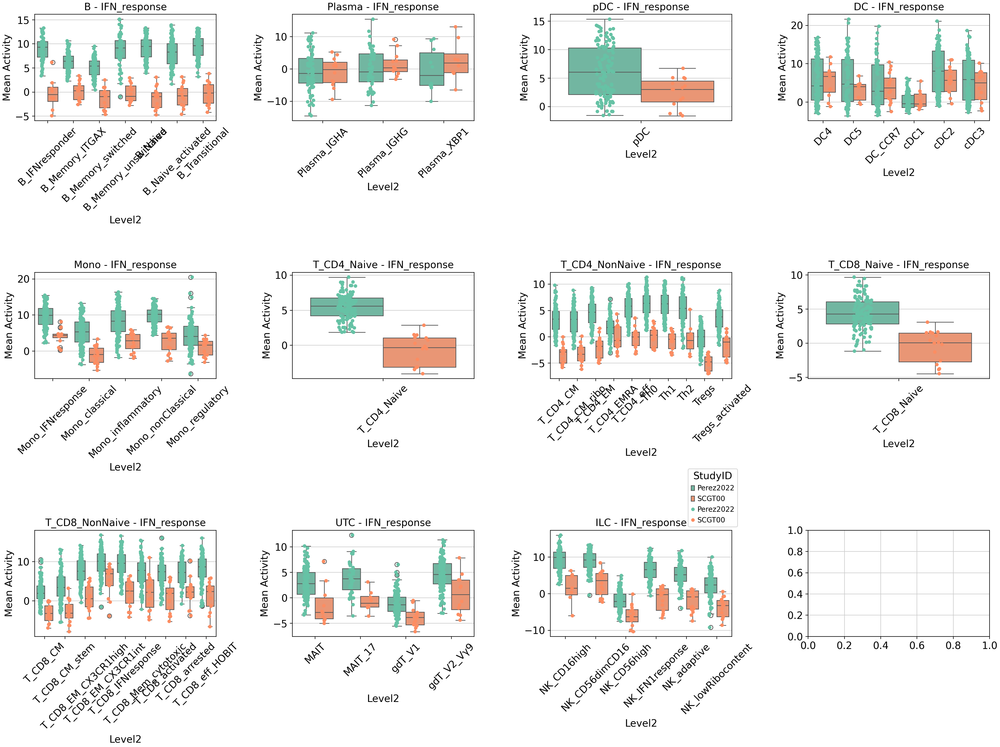

In [62]:
import matplotlib.pyplot as plt
import seaborn as sns
import re
fig, axes = plt.subplots(3, 4, figsize=(20, 15))
fig.subplots_adjust(wspace=0.5, hspace=0.5)

# Initialize a dictionary to store studyID-color mappings
studyID_colors = {}
# Initialize a variable to keep track of the last subplot
last_subplot = None

# Iterate over each celltype
for idx, (celltype, adata) in enumerate(cts_adata.items()):
    # Subset adata to disease == "SLE"
    adata_celltype = adata[(adata.obs['disease'] == 'SLE')]
    # Obtain activities
    estimate_df = adata_celltype.obsm['ulm_estimate']
    sig_col = [col for col in estimate_df.columns if col.split('-X-')[2] == 'IFN_response']
    estimate_df_sig = estimate_df[sig_col].copy()
    estimate_df_sig.columns = [col.split('-X-')[2] for col in estimate_df_sig.columns]

    # Obtain important obs
    subset_obs = adata_celltype.obs[['sampleID', 'disease', 'studyID','Level2']]
    
    # Concatenate estimate_df and subset_obs
    subset_df = pd.concat([estimate_df_sig, subset_obs], axis=1)
    #subset_df.columns = [col.replace("_" + celltype, "") for col in subset_df.columns]
    
    # Generate plots
    #signature = next((col for col in subset_df.columns if re.fullmatch(pattern, col)), None)
    signature = estimate_df_sig.columns[0]

    # Calculate mean activity per sample and studyID
    mean_activity = subset_df.groupby(['Level2', 'sampleID', 'studyID'])[signature].mean().reset_index()
    mean_activity = mean_activity.dropna(subset=[signature])

    # Determine the position of the subplot
    row = idx // 4
    col = idx % 4

    # Adjust the last row to accommodate the legend
    if row == 2 and col == 3:
        # Create an empty subplot for the legend
        last_subplot = plt.subplot2grid((3, 4), (2, 3), rowspan=1, colspan=1)
        last_subplot.axis('off')  # Turn off axis for the empty subplot
    else:
        # Create the plot in the appropriate subplot
        ax = axes[row, col]

        # Assign unique color to each studyID and store in the studyID_colors dictionary
        for studyID in mean_activity['studyID'].unique():
            if studyID not in studyID_colors:
                studyID_colors[studyID] = sns.color_palette('Set2', n_colors=len(studyID_colors) + 1)[len(studyID_colors)]

        # Plot the boxplot with consistent studyID colors
        sns.boxplot(x='Level2', y=signature, hue='studyID', data=mean_activity,
                    palette=studyID_colors, ax=ax)
        sns.stripplot(x='Level2', y=signature, hue='studyID', data=mean_activity,
                      palette=studyID_colors, dodge=True, jitter=True, size=5, ax=ax)
        ax.set_title(f'{celltype} - {signature}')
        ax.set_xlabel('Level2')
        ax.set_ylabel('Mean Activity')
        # Rotate x-axis labels
        ax.tick_params(axis='x', rotation=45)

        # Remove legend from all plots except the last one
        if idx != len(cts_adata) - 1:
            ax.get_legend().remove()
        else: 
            last_subplot = ax
            handles, labels = ax.get_legend_handles_labels()
            last_subplot.legend(handles, labels, title='StudyID', bbox_to_anchor=(1.05, 1), loc='lower right')  # Place legend outside

# Adjust layout
plt.tight_layout()
plt.show()

## Treated vs NonTreated

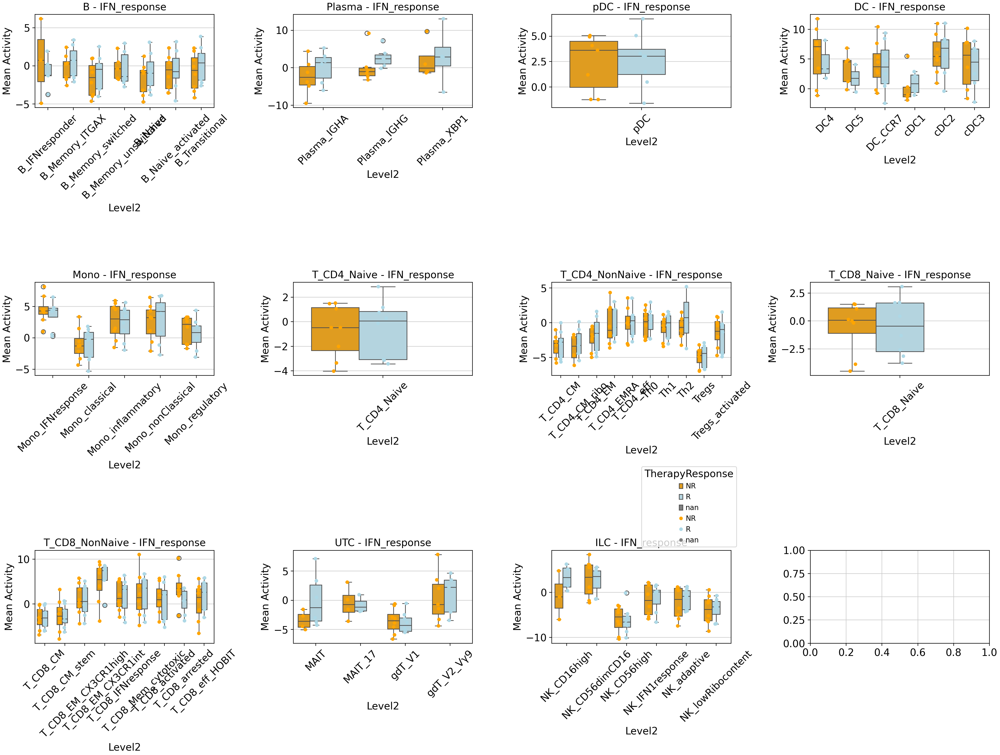

In [63]:
# Iterate over each celltype
import matplotlib.pyplot as plt
import seaborn as sns
import re
fig, axes = plt.subplots(3, 4, figsize=(20, 15))
fig.subplots_adjust(wspace=0.5, hspace=0.5)

# Initialize a dictionary to store studyID-color mappings
therapyResponse_colors = {'R': 'lightblue', 'NR': 'orange', 'nan': 'grey'}
# Initialize a variable to keep track of the last subplot
last_subplot = None

# Iterate over each celltype
for idx, (celltype, adata) in enumerate(cts_adata.items()):
    adata_celltype = adata[(adata.obs['disease'] == 'SLE')]
    estimate_df = adata_celltype.obsm['ulm_estimate']
    sig_col = [col for col in estimate_df.columns if col.split('-X-')[2] == 'IFN_response']
    estimate_df_sig = estimate_df[sig_col].copy()
    estimate_df_sig.columns = [col.split('-X-')[2] for col in estimate_df_sig.columns]
    subset_obs = adata_celltype.obs[['sampleID', 'disease', 'studyID','Level2']]
    subset_df = pd.concat([estimate_df_sig, subset_obs], axis=1)

    signature = estimate_df_sig.columns[0]
    
    # Calculate mean activity per sample and studyID
    mean_activity = subset_df.groupby(['Level2', 'sampleID', 'studyID'])[signature].mean().reset_index()
    mean_activity = mean_activity.dropna(subset=[signature])
    mean_activity = mean_activity[mean_activity['studyID'] == 'SCGT00']
    mean_activity = mean_activity.merge(SLE_metadata[['sampleID', 'Responder']], on='sampleID', how='left')

    # Determine the position of the subplot
    row = idx // 4
    col = idx % 4

    if row == 2 and col == 3:
        # Create an empty subplot for the legend
        last_subplot = plt.subplot2grid((3, 4), (2, 3), rowspan=1, colspan=1)
        last_subplot.axis('off')  # Turn off axis for the empty subplot
    else: 
        # Create the plot in the appropriate subplot
        ax = axes[row, col]
        
        # Assign unique color to each therapyResponse and store in the therapyResponse_colors dictionary
        for therapyResponse in mean_activity['Responder'].unique():
            if therapyResponse not in therapyResponse_colors:
                therapyResponse_colors[therapyResponse] = sns.color_palette('Set2')[len(therapyResponse_colors)]
        
        # Plot the boxplot with consistent therapyResponse colors
        sns.boxplot(x='Level2', y=signature, hue='Responder', data=mean_activity, palette=therapyResponse_colors, ax=ax)
        sns.stripplot(x='Level2', y=signature, hue='Responder', data=mean_activity, palette=therapyResponse_colors, dodge=True, jitter=True, size=5, ax=ax)
        ax.set_title(f'{celltype} - {signature}')
        ax.set_xlabel('Level2')
        ax.set_ylabel('Mean Activity')
        # Rotate x-axis labels
        ax.tick_params(axis='x', rotation=45)
        
        # Remove legend from all plots except the last one
        if idx != len(cts_adata) - 1:
            ax.get_legend().remove()
        else: 
            last_subplot = ax
            handles, labels = ax.get_legend_handles_labels()
            last_subplot.legend(handles, labels, title='TherapyResponse', bbox_to_anchor=(1.05, 1), loc='lower right')  # Place legend outside

# Adjust layout
plt.tight_layout()
plt.show()


## SLEDAI

**Generate SLEDAI categories**

In [64]:
SLEDAI_thr = 8.00
SLE_metadata['SLEDAI_category'] = np.nan
SLE_metadata.loc[SLE_metadata['SLEDAI_score'] <= SLEDAI_thr, 'SLEDAI_category'] = 'Low'
SLE_metadata.loc[SLE_metadata['SLEDAI_score'] > SLEDAI_thr, 'SLEDAI_category'] = 'High'
SLE_metadata.head()

,sampleID,SLEDAI_score,Flare,Responder,studyID,SLEDAI_category
0,Perez2022_1004_T0,2.0,notF,NaN,Perez2022,Low
1,Perez2022_1014_T0,2.0,notF,NaN,Perez2022,Low
2,Perez2022_1019_T0,0.0,notF,NaN,Perez2022,Low
3,Perez2022_1022_T0,2.0,notF,NaN,Perez2022,Low
4,Perez2022_1031_T0,2.0,notF,NaN,Perez2022,Low


In [65]:
SLE_metadata.shape

(178, 6)

In [66]:
SLE_metadata[["studyID", "SLEDAI_category"]].value_counts()

studyID    SLEDAI_category
Perez2022  Low                141
SCGT00     Low                  9
           High                 7
Perez2022  High                 5
dtype: int64

In [67]:
len(mean_activity.sampleID.unique())

16

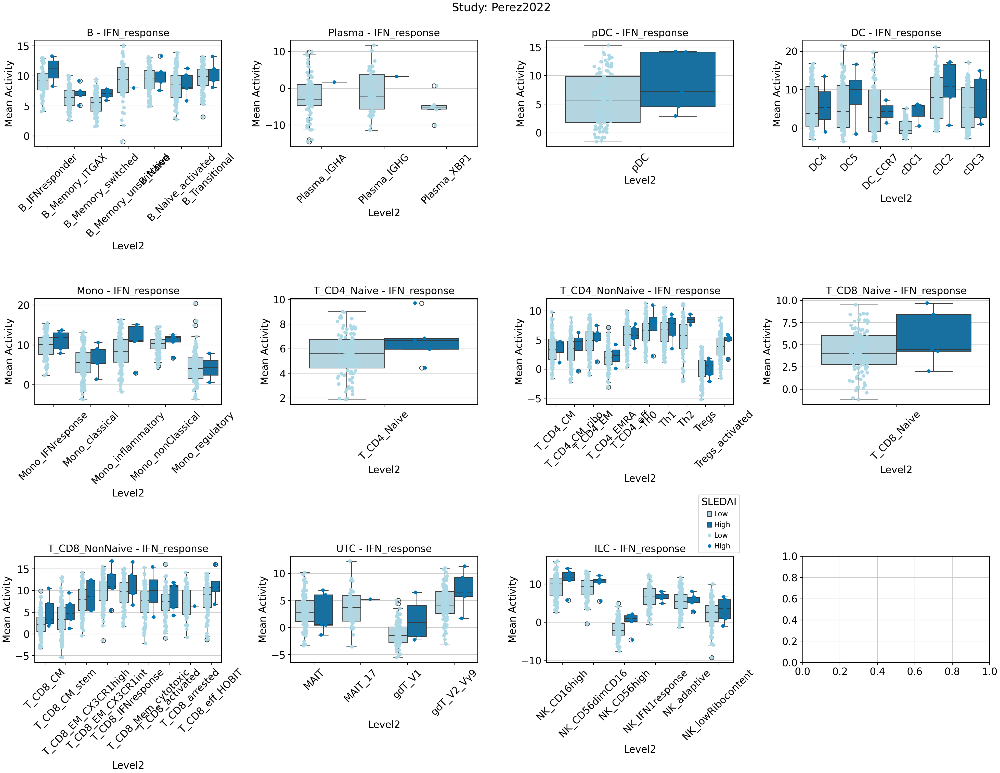

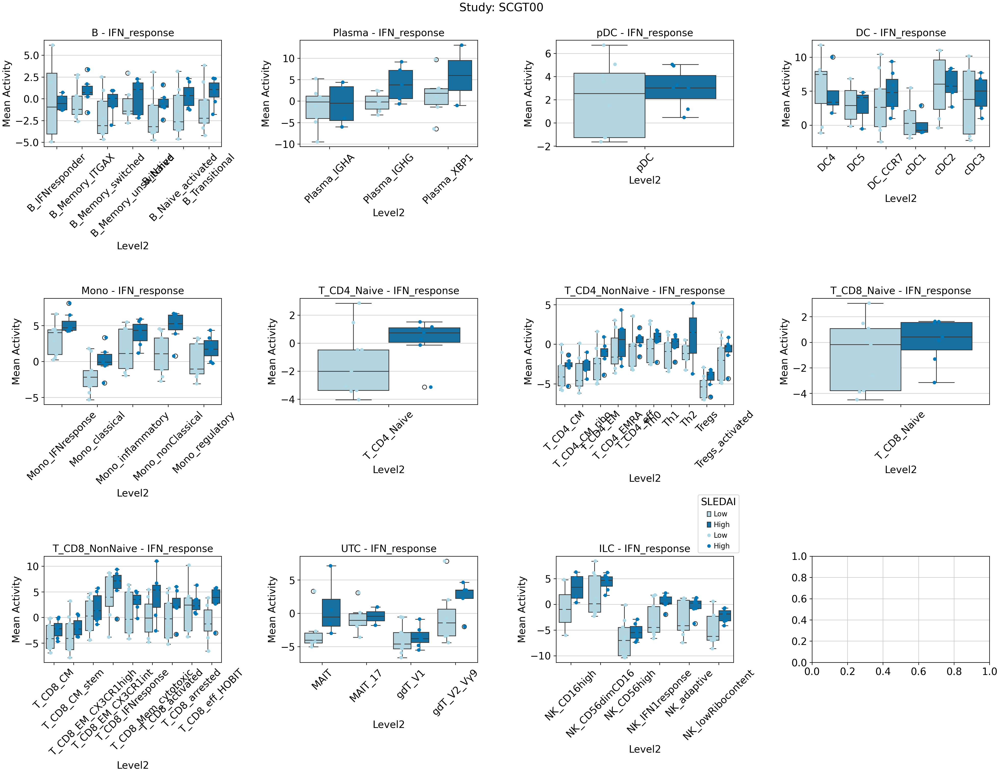

In [68]:
# Required libraries
import matplotlib.pyplot as plt
import seaborn as sns
import re

# Dictionary to store studyID-color mappings
therapyResponse_colors = {'Low': 'lightblue', 'High': '#0077b6', 'nan': 'grey'}

# Iterate over each studyID
for study in SLE_metadata['studyID'].unique():
    # Subset the data to the current studyID
    study_adata = {celltype: adata[adata.obs['studyID'] == study] for celltype, adata in cts_adata.items()}
    
    fig, axes = plt.subplots(3, 4, figsize=(20, 15))
    fig.subplots_adjust(wspace=0.5, hspace=0.5)
    
    # Initialize a variable to keep track of the last subplot
    last_subplot = None
    
    # Iterate over each celltype
    for idx, (celltype, adata) in enumerate(study_adata.items()):
        adata_celltype = adata[(adata.obs['disease'] == 'SLE')]
        estimate_df = adata_celltype.obsm['ulm_estimate']
        sig_col = [col for col in estimate_df.columns if col.split('-X-')[2] == 'IFN_response']
        estimate_df_sig = estimate_df[sig_col].copy()
        estimate_df_sig.columns = [col.split('-X-')[2] for col in estimate_df_sig.columns]
        subset_obs = adata_celltype.obs[['sampleID', 'disease', 'studyID','Level2']]
        subset_df = pd.concat([estimate_df_sig, subset_obs], axis=1)
    
        signature = estimate_df_sig.columns[0]
        
        # Calculate mean activity per sample and studyID
        mean_activity = subset_df.groupby(['Level2', 'sampleID', 'studyID'])[signature].mean().reset_index()
        mean_activity = mean_activity.dropna(subset=[signature])
        SLEDAI_met = SLE_metadata[SLE_metadata['SLEDAI_category'].notna()]
        mean_activity = mean_activity.merge(SLEDAI_met[['sampleID', 'SLEDAI_category']], on='sampleID', how='left')
        
        # Determine the position of the subplot
        row = idx // 4
        col = idx % 4
    
        if row == 2 and col == 3:
            # Create an empty subplot for the legend
            last_subplot = plt.subplot2grid((3, 4), (2, 3), rowspan=1, colspan=1)
            last_subplot.axis('off')  # Turn off axis for the empty subplot
        else: 
            # Create the plot in the appropriate subplot
            ax = axes[row, col]
            
            # Assign unique color to each therapyResponse and store in the therapyResponse_colors dictionary
            for therapyResponse in mean_activity['SLEDAI_category'].unique():
                if therapyResponse not in therapyResponse_colors:
                    therapyResponse_colors[therapyResponse] = sns.color_palette('Set2')[len(therapyResponse_colors)]
            
            # Plot the boxplot with consistent therapyResponse colors
            sns.boxplot(x='Level2', y=signature, hue='SLEDAI_category', data=mean_activity, palette=therapyResponse_colors, ax=ax)
            sns.stripplot(x='Level2', y=signature, hue='SLEDAI_category', data=mean_activity, palette=therapyResponse_colors, dodge=True, jitter=True, size=5, ax=ax)
            ax.set_title(f'{celltype} - {signature}')
            ax.set_xlabel('Level2')
            ax.set_ylabel('Mean Activity')
            # Rotate x-axis labels
            ax.tick_params(axis='x', rotation=45)
            
            # Remove legend from all plots except the last one
            if idx != len(study_adata) - 1:
                ax.get_legend().remove()
            else: 
                last_subplot = ax
                handles, labels = ax.get_legend_handles_labels()
                last_subplot.legend(handles, labels, title='SLEDAI', bbox_to_anchor=(1.05, 1), loc='lower right')  # Place legend outside
    
    # Adjust layout
    plt.tight_layout()
    plt.suptitle(f'Study: {study}', y=1.02, fontsize=16)
    plt.show()


In [69]:
adata = cts_adata["B"]
adata_celltype = adata[(adata.obs['studyID'].isin(['SCGT00', 'Perez2022'])) & (adata.obs['disease'].isin(['healthy', 'SLE']))]
estimate_df = adata_celltype.obsm['ulm_estimate']
sig_col = [col for col in estimate_df.columns if col.split('-X-')[2] == 'IFN_response']
estimate_df_sig = estimate_df[sig_col].copy()
estimate_df_sig.columns = [col.split('-X-')[2] for col in estimate_df_sig.columns]
subset_obs = adata_celltype.obs[['sampleID', 'disease', 'studyID','Level2']]
subset_df = pd.concat([estimate_df_sig, subset_obs], axis=1)

signature = estimate_df_sig.columns[0]

# Calculate mean activity per sample and studyID
mean_activity = subset_df.groupby(['Level2', 'sampleID', "disease",'studyID'])[signature].mean().reset_index()
mean_activity = mean_activity.dropna(subset=[signature])
mean_activity_SLE = mean_activity[mean_activity['disease'] == 'SLE']
mean_response_healthy = mean_activity[mean_activity['disease'] == 'healthy'].groupby(['Level2', 'studyID'])['IFN_response'].mean()
lookup_dict = mean_response_healthy.to_dict()
lookup_dict

{('B_IFNresponder', 'Perez2022'): 5.13370943069458,
 ('B_IFNresponder', 'SCGT00'): -3.000864028930664,
 ('B_Memory_ITGAX', 'Perez2022'): 4.284903526306152,
 ('B_Memory_ITGAX', 'SCGT00'): -2.883885145187378,
 ('B_Memory_switched', 'Perez2022'): 2.713127851486206,
 ('B_Memory_switched', 'SCGT00'): -4.820379257202148,
 ('B_Memory_unswitched', 'Perez2022'): 3.612309217453003,
 ('B_Memory_unswitched', 'SCGT00'): -3.652602195739746,
 ('B_Naive', 'Perez2022'): 5.3055830001831055,
 ('B_Naive', 'SCGT00'): -4.786822319030762,
 ('B_Naive_activated', 'Perez2022'): 4.494810581207275,
 ('B_Naive_activated', 'SCGT00'): -4.103580474853516,
 ('B_Transitional', 'Perez2022'): 5.4452033042907715,
 ('B_Transitional', 'SCGT00'): -4.092739582061768}

In [70]:
def compute_sig_LogFC(row):
    level2_studyID = (row['Level2'], row['studyID'])
    if level2_studyID in lookup_dict:
        selected_value = lookup_dict[level2_studyID]
        return np.log2(row['IFN_response'] / selected_value)
    else:
        return np.nan

In [71]:
mean_activity_SLE['sig_LogFC'] = mean_activity_SLE.apply(compute_sig_LogFC, axis=1)
SLEDAI_met = SLE_metadata[SLE_metadata['SLEDAI_category'].notna()]
mean_activity_SLE = mean_activity_SLE.merge(SLEDAI_met[['sampleID', 'SLEDAI_category']], on='sampleID', how='left')

mean_activity_SLE.head()

,Level2,sampleID,disease,studyID,IFN_response,sig_LogFC,SLEDAI_category
0,B_IFNresponder,Perez2022_1015_T0,SLE,Perez2022,12.180696,1.246523,Low
1,B_IFNresponder,Perez2022_1019_T0,SLE,Perez2022,7.746634,0.593568,Low
2,B_IFNresponder,Perez2022_1046_T0,SLE,Perez2022,9.454164,0.880948,Low
3,B_IFNresponder,Perez2022_1054_T0,SLE,Perez2022,10.560745,1.040638,Low
4,B_IFNresponder,Perez2022_1063_T0,SLE,Perez2022,9.659035,0.911877,Low


In [86]:
Perez2022_colors = {'Low': (0.4, 0.7607843137254902, 0.6470588235294118), 'High': (0.4, 0.7607843137254902, 0.6470588235294118), 'nan': (0.4, 0.7607843137254902, 0.6470588235294118)}
SCGT00_colors = {'Low': (0.9882352941176471, 0.5529411764705883, 0.3843137254901961), 'High': (0.9882352941176471, 0.5529411764705883, 0.3843137254901961), 'nan': (0.9882352941176471, 0.5529411764705883, 0.3843137254901961)}

<Axes: xlabel='Level2', ylabel='sig_LogFC'>

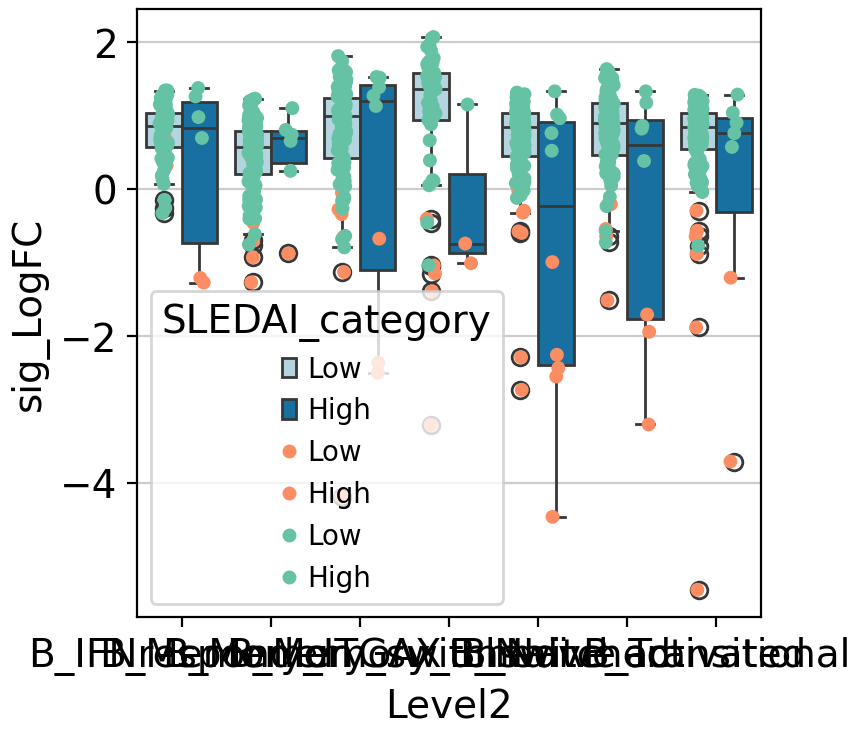

In [88]:
sns.boxplot(x='Level2', y="sig_LogFC", hue='SLEDAI_category', data=mean_activity_SLE, palette=therapyResponse_colors)
sns.stripplot(x='Level2', y='sig_LogFC', hue='SLEDAI_category', marker='o', size = 5, dodge=True, palette=SCGT00_colors, data=mean_activity_SLE[mean_activity_SLE['studyID'] == 'SCGT00'])
sns.stripplot(x='Level2', y='sig_LogFC', hue='SLEDAI_category', marker='o', size = 5, dodge=True, palette=Perez2022_colors, data=mean_activity_SLE[mean_activity_SLE['studyID'] == 'Perez2022'])

In [91]:
print(mean_activity_SLE.head())

        Level2           sampleID disease    studyID  IFN_response  sig_LogFC  \
0  NK_CD16high  Perez2022_1004_T0     SLE  Perez2022     11.526558   1.012029   
1  NK_CD16high  Perez2022_1015_T0     SLE  Perez2022     12.721654   1.154353   
2  NK_CD16high  Perez2022_1019_T0     SLE  Perez2022      8.649773   0.597801   
3  NK_CD16high  Perez2022_1046_T0     SLE  Perez2022     10.767551   0.913757   
4  NK_CD16high  Perez2022_1051_T0     SLE  Perez2022     10.783874   0.915943   

  SLEDAI_category  
0             Low  
1             Low  
2             Low  
3             Low  
4             Low  


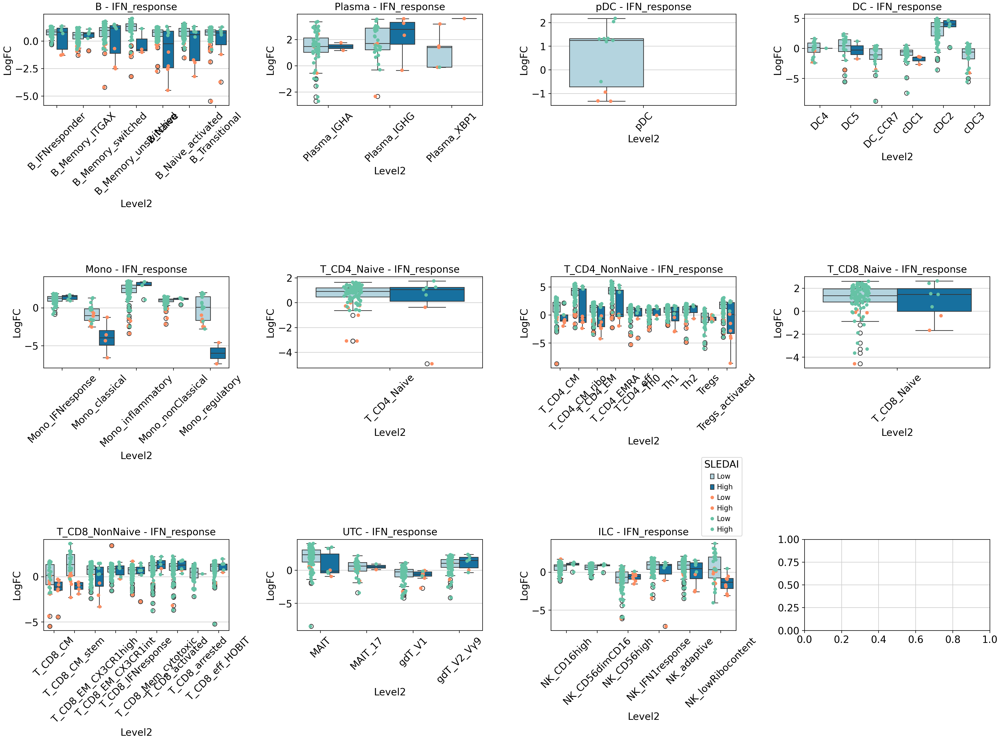

In [95]:
# Required libraries
import matplotlib.pyplot as plt
import seaborn as sns
import re

# Dictionary to store studyID-color mappings
therapyResponse_colors = {'Low': 'lightblue', 'High': '#0077b6', 'nan': 'grey'}
Perez2022_colors = {'Low': (0.4, 0.7607843137254902, 0.6470588235294118), 'High': (0.4, 0.7607843137254902, 0.6470588235294118), 'nan': (0.4, 0.7607843137254902, 0.6470588235294118)}
SCGT00_colors = {'Low': (0.9882352941176471, 0.5529411764705883, 0.3843137254901961), 'High': (0.9882352941176471, 0.5529411764705883, 0.3843137254901961), 'nan': (0.9882352941176471, 0.5529411764705883, 0.3843137254901961)}
    
fig, axes = plt.subplots(3, 4, figsize=(20, 15))
fig.subplots_adjust(wspace=0.5, hspace=0.5)

# Initialize a variable to keep track of the last subplot
last_subplot = None

# Iterate over each celltype
for idx, (celltype, adata) in enumerate(cts_adata.items()):
    adata_celltype = adata[(adata.obs['studyID'].isin(['SCGT00', 'Perez2022'])) & (adata.obs['disease'].isin(['healthy', 'SLE']))]
    estimate_df = adata_celltype.obsm['ulm_estimate']
    sig_col = [col for col in estimate_df.columns if col.split('-X-')[2] == 'IFN_response']
    estimate_df_sig = estimate_df[sig_col].copy()
    estimate_df_sig.columns = [col.split('-X-')[2] for col in estimate_df_sig.columns]
    subset_obs = adata_celltype.obs[['sampleID', 'disease', 'studyID','Level2']]
    subset_df = pd.concat([estimate_df_sig, subset_obs], axis=1)
    
    signature = estimate_df_sig.columns[0]
    
    # Calculate mean activity per sample and studyID
    mean_activity = subset_df.groupby(['Level2', 'sampleID', "disease",'studyID'])[signature].mean().reset_index()
    mean_activity = mean_activity.dropna(subset=[signature])
    mean_activity_SLE = mean_activity[mean_activity['disease'] == 'SLE']
    mean_response_healthy = mean_activity[mean_activity['disease'] == 'healthy'].groupby(['Level2', 'studyID'])['IFN_response'].mean()
    lookup_dict = mean_response_healthy.to_dict()
    mean_activity_SLE['sig_LogFC'] = mean_activity_SLE.apply(compute_sig_LogFC, axis=1)
    SLEDAI_met = SLE_metadata[SLE_metadata['SLEDAI_category'].notna()]
    mean_activity_SLE = mean_activity_SLE.merge(SLEDAI_met[['sampleID', 'SLEDAI_category']], on='sampleID', how='left')
    
    # Determine the position of the subplot
    row = idx // 4
    col = idx % 4

    if row == 2 and col == 3:
        # Create an empty subplot for the legend
        last_subplot = plt.subplot2grid((3, 4), (2, 3), rowspan=1, colspan=1)
        last_subplot.axis('off')  # Turn off axis for the empty subplot
    else: 
        # Create the plot in the appropriate subplot
        ax = axes[row, col]
        
        # Assign unique color to each therapyResponse and store in the therapyResponse_colors dictionary
        for therapyResponse in mean_activity_SLE['SLEDAI_category'].unique():
            if therapyResponse not in therapyResponse_colors:
                therapyResponse_colors[therapyResponse] = sns.color_palette('Set2')[len(therapyResponse_colors)]
        
        # Plot the boxplot with consistent therapyResponse colors
        sns.boxplot(x='Level2', y="sig_LogFC", hue='SLEDAI_category', data=mean_activity_SLE, palette=therapyResponse_colors, ax=ax)
        sns.stripplot(x='Level2', y='sig_LogFC', hue='SLEDAI_category', marker='o', size = 5, dodge=True, palette=SCGT00_colors, data=mean_activity_SLE[mean_activity_SLE['studyID'] == 'SCGT00'], ax=ax)
        sns.stripplot(x='Level2', y='sig_LogFC', hue='SLEDAI_category', marker='o', size = 5, dodge=True, palette=Perez2022_colors, data=mean_activity_SLE[mean_activity_SLE['studyID'] == 'Perez2022'], ax=ax)
        ax.set_title(f'{celltype} - {signature}')
        ax.set_xlabel('Level2')
        ax.set_ylabel('LogFC')
        # Rotate x-axis labels
        ax.tick_params(axis='x', rotation=45)
        
        # Remove legend from all plots except the last one
        if idx != len(cts_adata) - 1:
            ax.get_legend().remove()
        else: 
            last_subplot = ax
            handles, labels = ax.get_legend_handles_labels()
            last_subplot.legend(handles, labels, title='SLEDAI', bbox_to_anchor=(1.05, 1), loc='lower right')  # Place legend outside

# Adjust layout
plt.tight_layout()
plt.show()

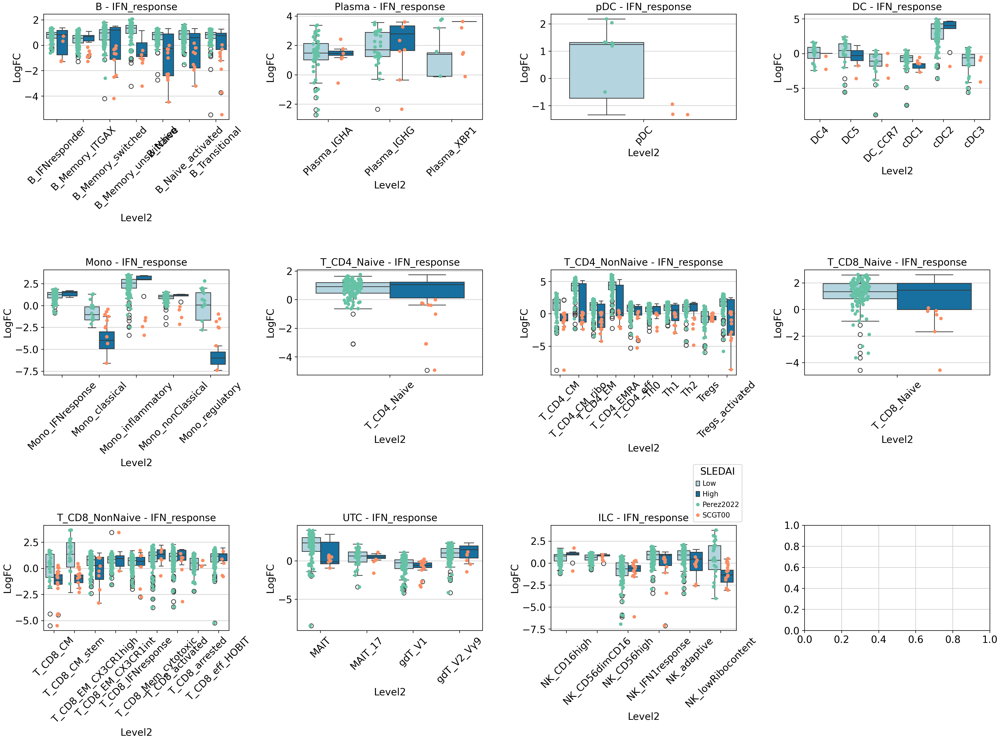

In [108]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Example data setup (replace with your actual data and variables)
# Example color palettes
therapyResponse_colors = {'Low': 'lightblue', 'High': '#0077b6', 'nan': 'grey'}
studyID_colors = {'Perez2022': (0.4, 0.7607843137254902, 0.6470588235294118),
                  'SCGT00': (0.9882352941176471, 0.5529411764705883, 0.3843137254901961)}

fig, axes = plt.subplots(3, 4, figsize=(20, 15))
fig.subplots_adjust(wspace=0.5, hspace=0.5)

# Initialize a variable to keep track of the last subplot
last_subplot = None

# Example function to compute sig_LogFC (replace with your actual implementation)
def compute_sig_LogFC(row):
    level2_studyID = (row['Level2'], row['studyID'])
    selected_value = lookup_dict.get(level2_studyID, None)
    if selected_value is not None:
        return np.log2(row['IFN_response'] / selected_value)
    else:
        return np.nan

# Iterate over each celltype
for idx, (celltype, adata) in enumerate(cts_adata.items()):
    adata_celltype = adata[(adata.obs['studyID'].isin(['SCGT00', 'Perez2022'])) & (adata.obs['disease'].isin(['healthy', 'SLE']))]
    estimate_df = adata_celltype.obsm['ulm_estimate']
    sig_col = [col for col in estimate_df.columns if col.split('-X-')[2] == 'IFN_response']
    estimate_df_sig = estimate_df[sig_col].copy()
    estimate_df_sig.columns = [col.split('-X-')[2] for col in estimate_df_sig.columns]
    subset_obs = adata_celltype.obs[['sampleID', 'disease', 'studyID','Level2']]
    subset_df = pd.concat([estimate_df_sig, subset_obs], axis=1)
    
    signature = estimate_df_sig.columns[0]
    
    # Calculate mean activity per sample and studyID
    mean_activity = subset_df.groupby(['Level2', 'sampleID', "disease",'studyID'])[signature].mean().reset_index()
    mean_activity = mean_activity.dropna(subset=[signature])
    mean_activity_SLE = mean_activity[mean_activity['disease'] == 'SLE']
    mean_response_healthy = mean_activity[mean_activity['disease'] == 'healthy'].groupby(['Level2', 'studyID'])['IFN_response'].mean()
    lookup_dict = mean_response_healthy.to_dict()
    mean_activity_SLE['sig_LogFC'] = mean_activity_SLE.apply(compute_sig_LogFC, axis=1)
    SLEDAI_met = SLE_metadata[SLE_metadata['SLEDAI_category'].notna()]
    mean_activity_SLE = mean_activity_SLE.merge(SLEDAI_met[['sampleID', 'SLEDAI_category']], on='sampleID', how='left')
    
    # Determine the position of the subplot
    row = idx // 4
    col = idx % 4

    if row == 2 and col == 3:
        # Create an empty subplot for the legend
        last_subplot = plt.subplot2grid((3, 4), (2, 3), rowspan=1, colspan=1)
        last_subplot.axis('off')  # Turn off axis for the empty subplot
    else: 
        # Create the plot in the appropriate subplot
        ax = axes[row, col]
        
        # Assign unique color to each therapyResponse and store in the therapyResponse_colors dictionary
        for therapyResponse in mean_activity_SLE['SLEDAI_category'].unique():
            if therapyResponse not in therapyResponse_colors:
                therapyResponse_colors[therapyResponse] = sns.color_palette('Set2')[len(therapyResponse_colors)]
        
        # Plot the boxplot with consistent therapyResponse colors
        sns.boxplot(x='Level2', y="sig_LogFC", hue='SLEDAI_category', data=mean_activity_SLE, palette=therapyResponse_colors, ax=ax)
        
        # Plot the stripplot with studyID colors
        sns.stripplot(x='Level2', y="sig_LogFC", hue='studyID', data=mean_activity_SLE, palette=studyID_colors, dodge=True, jitter=True, size=5, ax=ax)
        
        ax.set_title(f'{celltype} - {signature}')
        ax.set_xlabel('Level2')
        ax.set_ylabel('LogFC')
        # Rotate x-axis labels
        ax.tick_params(axis='x', rotation=45)
        
        # Remove legend from all plots except the last one
        if idx != len(cts_adata) - 1:
            ax.get_legend().remove()
        else: 
            last_subplot = ax
            handles, labels = ax.get_legend_handles_labels()
            last_subplot.legend(handles, labels, title='SLEDAI', bbox_to_anchor=(1.05, 1), loc='lower right')  # Place legend outside

# Adjust layout
plt.tight_layout()
plt.show()


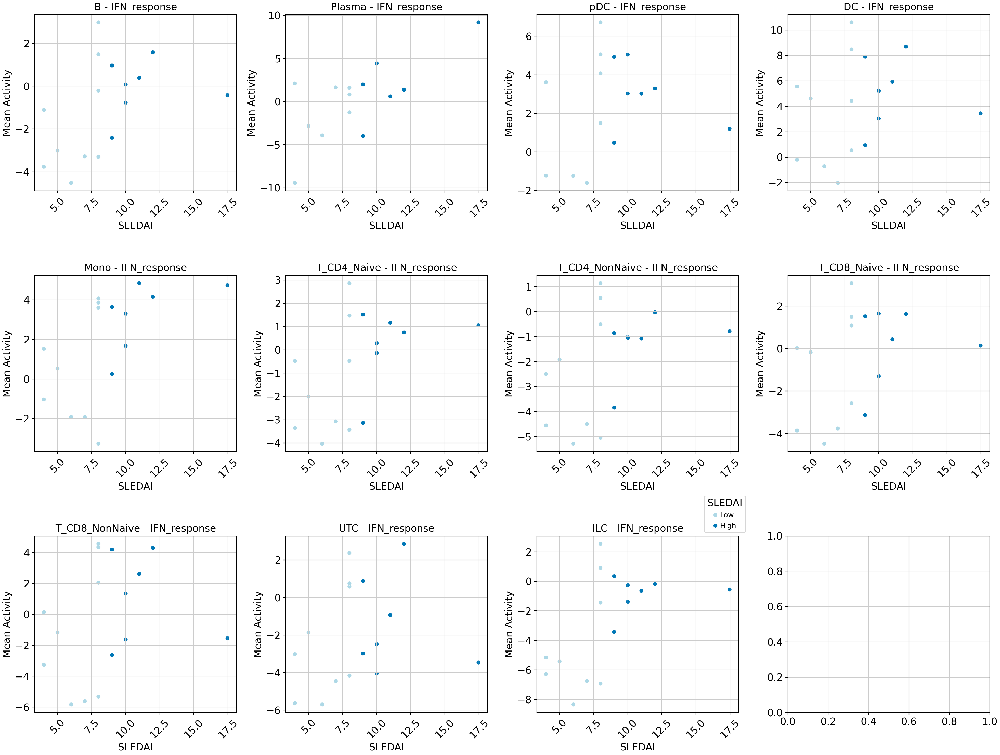

In [45]:
# Iterate over each celltype
import matplotlib.pyplot as plt
import seaborn as sns
import re
fig, axes = plt.subplots(3, 4, figsize=(20, 15))
fig.subplots_adjust(wspace=0.5, hspace=0.5)

# Initialize a dictionary to store studyID-color mappings
therapyResponse_colors = {'Low': 'lightblue', 'High': '#0077b6', 'nan': 'grey'}
# Initialize a variable to keep track of the last subplot
last_subplot = None

# Iterate over each celltype
for idx, (celltype, adata) in enumerate(cts_adata.items()):
    adata_celltype = adata[(adata.obs['disease'] == 'SLE')]
    estimate_df = adata_celltype.obsm['ulm_estimate']
    sig_col = [col for col in estimate_df.columns if col.split('-X-')[2] == 'IFN_response']
    estimate_df_sig = estimate_df[sig_col].copy()
    estimate_df_sig.columns = [col.split('-X-')[2] for col in estimate_df_sig.columns]
    subset_obs = adata_celltype.obs[['sampleID', 'disease', 'studyID','Level2']]
    subset_df = pd.concat([estimate_df_sig, subset_obs], axis=1)

    signature = estimate_df_sig.columns[0]
    
    # Calculate mean activity per sample and studyID
    mean_activity = subset_df.groupby(['sampleID', 'studyID'])[signature].mean().reset_index()
    mean_activity = mean_activity.dropna(subset=[signature])
    mean_activity = mean_activity[mean_activity['studyID'] == 'SCGT00']
    mean_activity = mean_activity.merge(SCG_obs_merged[['sampleID', 'SLEDAI', "ACT.basalWeek"]], on='sampleID', how='left')
    
    # Determine the position of the subplot
    row = idx // 4
    col = idx % 4

    if row == 2 and col == 3:
        # Create an empty subplot for the legend
        last_subplot = plt.subplot2grid((3, 4), (2, 3), rowspan=1, colspan=1)
        last_subplot.axis('off')  # Turn off axis for the empty subplot
    else: 
        # Create the plot in the appropriate subplot
        ax = axes[row, col]
        
        # Plot the boxplot with consistent therapyResponse colors
        sns.scatterplot(x='ACT.basalWeek', y=signature, hue='SLEDAI', palette=therapyResponse_colors, data=mean_activity, ax=ax)
        #sns.boxplot(x='Level2', y=signature, hue='SLEDAI', data=mean_activity, palette=therapyResponse_colors, ax=ax)
        #sns.stripplot(x='Level2', y=signature, hue='SLEDAI', data=mean_activity, palette=therapyResponse_colors, dodge=True, jitter=True, size=5, ax=ax)
        ax.set_title(f'{celltype} - {signature}')
        ax.set_xlabel('SLEDAI')
        ax.set_ylabel('Mean Activity')
        # Rotate x-axis labels
        ax.tick_params(axis='x', rotation=45)
        
        # Remove legend from all plots except the last one
        if idx != len(cts_adata) - 1:
            ax.get_legend().remove()
        else: 
            last_subplot = ax
            handles, labels = ax.get_legend_handles_labels()
            last_subplot.legend(handles, labels, title='SLEDAI', bbox_to_anchor=(1.05, 1), loc='lower right')  # Place legend outside

# Adjust layout
plt.tight_layout()
plt.show()


## Flare vs NonFlare

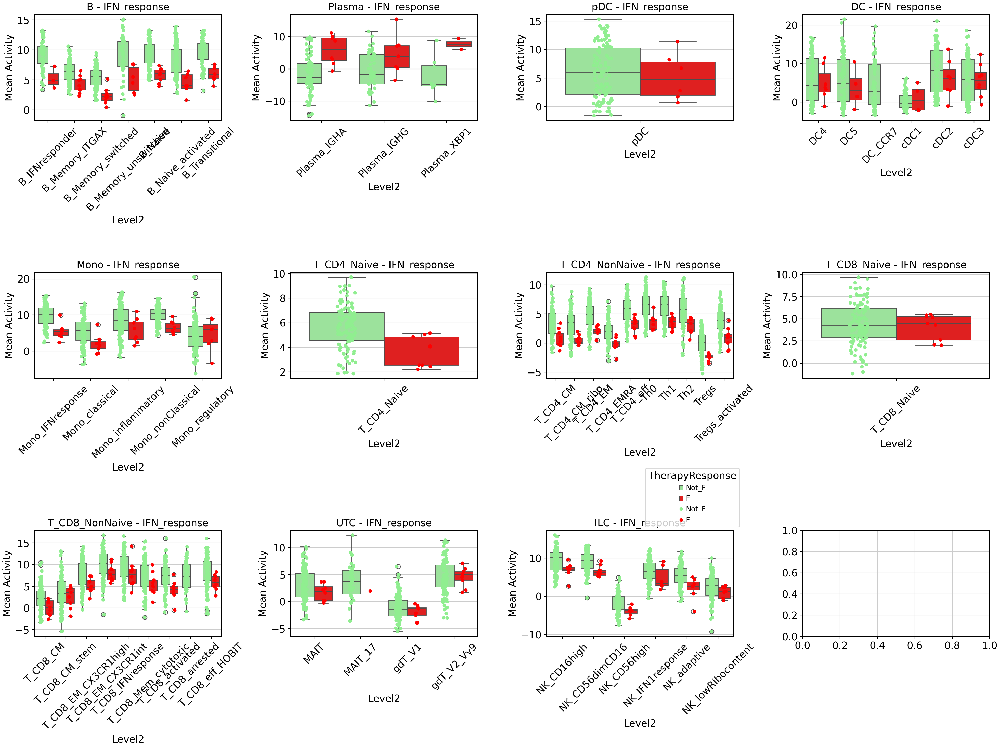

In [46]:
# Iterate over each celltype
import matplotlib.pyplot as plt
import seaborn as sns
import re
fig, axes = plt.subplots(3, 4, figsize=(20, 15))
fig.subplots_adjust(wspace=0.5, hspace=0.5)

# Initialize a dictionary to store therapyResponse-color mappings
therapyResponse_colors = {'F': 'red', 'Not_F': 'lightgreen', 'nan': 'grey'}
# Initialize a variable to keep track of the last subplot
last_subplot = None

# Iterate over each celltype
for idx, (celltype, adata) in enumerate(cts_adata.items()):
    adata_celltype = adata[(adata.obs['disease'] == 'SLE')]
    estimate_df = adata_celltype.obsm['ulm_estimate']
    sig_col = [col for col in estimate_df.columns if col.split('-X-')[2] == 'IFN_response']
    estimate_df_sig = estimate_df[sig_col].copy()
    estimate_df_sig.columns = [col.split('-X-')[2] for col in estimate_df_sig.columns]
    subset_obs = adata_celltype.obs[['sampleID', 'disease', 'studyID','Level2']]
    subset_df = pd.concat([estimate_df_sig, subset_obs], axis=1)

    signature = estimate_df_sig.columns[0]
    
    # Calculate mean activity per sample and studyID
    mean_activity = subset_df.groupby(['Level2', 'sampleID', 'studyID'])[signature].mean().reset_index()
    mean_activity = mean_activity.dropna(subset=[signature])
    mean_activity = mean_activity[mean_activity['studyID'] == 'Perez2022']
    mean_activity['Flare'] = np.where(mean_activity['sampleID'].str.contains('FLARE', case=False, na=False), 'F', 'Not_F')

    # Determine the position of the subplot
    row = idx // 4
    col = idx % 4

    if row == 2 and col == 3:
        # Create an empty subplot for the legend
        last_subplot = plt.subplot2grid((3, 4), (2, 3), rowspan=1, colspan=1)
        last_subplot.axis('off')  # Turn off axis for the empty subplot
    else: 
        # Create the plot in the appropriate subplot
        ax = axes[row, col]
                
        # Plot the boxplot with consistent therapyResponse colors
        sns.boxplot(x='Level2', y=signature, hue='Flare', data=mean_activity, palette=therapyResponse_colors, ax=ax)
        sns.stripplot(x='Level2', y=signature, hue='Flare', data=mean_activity, palette=therapyResponse_colors, dodge=True, jitter=True, size=5, ax=ax)
        ax.set_title(f'{celltype} - {signature}')
        ax.set_xlabel('Level2')
        ax.set_ylabel('Mean Activity')
        # Rotate x-axis labels
        ax.tick_params(axis='x', rotation=45)
    
        # Remove legend from all plots except the last one
        if idx != len(cts_adata) - 1:
            ax.get_legend().remove()
        else: 
            last_subplot = ax
            handles, labels = ax.get_legend_handles_labels()
            last_subplot.legend(handles, labels, title='TherapyResponse', bbox_to_anchor=(1.05, 1), loc='lower right')  # Place legend outside

# Adjust layout
plt.tight_layout()
plt.show()


# Flu

In [47]:
with open(here('00_data_processing/results/extended_obs/COMBAT2022_obs.pkl'), 'rb') as file:
    COMBAT_obs_extended = pickle.load(file)

with open(here('00_data_processing/results/study_metadata/COMBAT2022_patient_metadata.pkl'), 'rb') as file:
    COMBAT_obs = pickle.load(file)

In [48]:
COMBAT_obs_extended.head()

,index,author_annotation_level_3,author_annotation_level_2,author_annotation_level_1,Annotation_cell_type,COMBAT_ID,sample_id,COMBAT_participant_timepoint_ID,COVID_severity,Age,Sex,Institute,batch,Channel_ID,age_bin,studyID,INFL_chemistry,INFL_technology,cell_barcode,INFL_lID,INFL_pID,timepoint_replicate,INFL_lID_pID_TP,INFL_sID
cellID,,,,,,,,,,,,,,,,,,,,,,,,
COMBAT2022_L000_S00109_T0_AAACCTGAGAAAGTGG,0,NK.CD16hi.1,NK.CD16hi,NK,NK,S00109,S00109-Ja001E-PBCa,S00109-Ja001,COVID_SEV,5.0,female,Oxford,gPlexA,A1,51-60,COMBAT2022,5_GEX_V1,5_GEX_V1_GenoHashed,AAACCTGAGAAAGTGG,COMBAT2022_L000,COMBAT2022_S00109,0,COMBAT2022_L000_S00109_T0,COMBAT2022_S00109_T0
COMBAT2022_L000_S00112_T0_AAACCTGAGCGGATCA,1,CD8.TEMRA.1,CD8.TEMRA,CD8,T,S00112,S00112-Ja003E-PBCa,S00112-Ja003,COVID_MILD,5.0,female,Oxford,gPlexA,A1,51-60,COMBAT2022,5_GEX_V1,5_GEX_V1_GenoHashed,AAACCTGAGCGGATCA,COMBAT2022_L000,COMBAT2022_S00112,0,COMBAT2022_L000_S00112_T0,COMBAT2022_S00112_T0
COMBAT2022_L000_G05153_T0_AAACCTGAGGACATTA,2,nan,nan,nan,nan,G05153,G05153-Ja005E-PBCa,G05153-Ja005,COVID_HCW_MILD,4.0,male,Oxford,gPlexA,A1,41-50,COMBAT2022,5_GEX_V1,5_GEX_V1_GenoHashed,AAACCTGAGGACATTA,COMBAT2022_L000,COMBAT2022_G05153,0,COMBAT2022_L000_G05153_T0,COMBAT2022_G05153_T0
COMBAT2022_L000_S00005_T1_AAACCTGAGGCGACAT,3,ncMono,ncMono,ncMono,MNP,S00005,S00005-Ja005E-PBCa,S00005-Ja005,COVID_CRIT,7.0,male,Oxford,gPlexA,A1,71-80,COMBAT2022,5_GEX_V1,5_GEX_V1_GenoHashed,AAACCTGAGGCGACAT,COMBAT2022_L000,COMBAT2022_S00005,1,COMBAT2022_L000_S00005_T1,COMBAT2022_S00005_T1
COMBAT2022_L000_S00061_T0_AAACCTGAGGGAACGG,4,cMono.LGALS2.AHNAK,cMono,cMono,MNP,S00061,S00061-Ja003E-PBCa,S00061-Ja003,COVID_SEV,5.0,female,Oxford,gPlexA,A1,51-60,COMBAT2022,5_GEX_V1,5_GEX_V1_GenoHashed,AAACCTGAGGGAACGG,COMBAT2022_L000,COMBAT2022_S00061,0,COMBAT2022_L000_S00061_T0,COMBAT2022_S00061_T0


## Activity per donor

# 

# 

# 

# 

# 

# 

# 

# Check expression of IFNA and IFNB1

**Load adata**

In [28]:
cts_adata = {}
for celltype in ['B', 'Plasma', 'pDC', 'DC', 'Mono', 'T_CD4_Naive', 'T_CD4_NonNaive', 'T_CD8_Naive', 'T_CD8_NonNaive', 'UTC','ILC', 'Cycling_cells', 'Progenitors']:
#for celltype in ["ILC", "Mono", 'B', 'T_CD4_NonNaive', 'T_CD8_NonNaive', 'Plasma','pDC', 'DC']:
    print(celltype)
    inputfile_path = here("03_downstream_analysis/04_integration_with_annotation/results/normalized_adatas_nextflow/cellType_adata_merged/{}_adataMerged.log1p.h5ad".format(celltype))
    # Loading scanpy (Anndata) object
    adata_cell = sc.read_h5ad(inputfile_path)
    # Loading
    adata_cell.layers["scANVI_correct_expr_scaled"] = adata_cell.X.copy()
    #zscaling
    sc.pp.scale(adata_cell, layer="scANVI_correct_expr_scaled")
    #adata_cell.X = adata_cell.layers["scANVI_correct_expr_scaled"]   
    cts_adata[celltype] = adata_cell

B
Plasma
pDC
DC
Mono
T_CD4_Naive
T_CD4_NonNaive
T_CD8_Naive
T_CD8_NonNaive
UTC
ILC
Cycling_cells
Progenitors


**Generate ViolinPlots**

In [29]:
ifn_genes = varDF[varDF['symbol'].str.startswith("IFN")]

# Print the filtered DataFrame
print(ifn_genes)

                   symbol
ensembl_gene_id          
ENSG00000027697    IFNGR1
ENSG00000111537      IFNG
ENSG00000142166    IFNAR1
ENSG00000159110    IFNAR2
ENSG00000159128    IFNGR2
ENSG00000177047     IFNW1
ENSG00000182393     IFNL1
ENSG00000185436    IFNLR1
ENSG00000255733  IFNG-AS1


In [30]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Initialize an empty list to store gene-specific DataFrames
gene_dfs = []

# Gene symbol of interest
variable = "Level1"
for gene_symbol in ifn_genes.symbol.values: 
    # Get the corresponding ensembl gene ID
    gene_of_interest = varDF.index[varDF['symbol'] == gene_symbol][0]
    
    # Initialize lists to store data
    level1_categories = []
    disease_values = []
    expression_values = []
    gene_values = []  # New list to store gene symbol
    
    # Iterate over each cell type
    for i, (celltype, adata) in enumerate(cts_adata.items()):
        # Exclude "Progenitors"
        if celltype != "Progenitors":
            # Check if the gene of interest is present in the var_names
            if gene_of_interest in adata.var_names:
                # Filter cells expressing the gene of interest
                adata_subset = adata[:, adata.var_names == gene_of_interest]
                
                # Check if the subset is not empty
                if adata_subset.shape[0] > 0:
                    # Extract the expression values, level1 categories, and disease values
                    expression_values.extend(adata_subset.X.flatten())
                    level1_categories.extend(adata_subset.obs[variable].values)
                    disease_values.extend(adata_subset.obs["disease"].values)
                    gene_values.extend([gene_symbol] * len(adata_subset.obs))  # Add gene symbol
                    
    # Create gene-specific DataFrame
    gene_df = pd.DataFrame({"Gene": gene_values, "Level1": level1_categories, "Disease": disease_values, "Expression": expression_values})
    gene_dfs.append(gene_df)

In [34]:
merged_df = pd.concat(gene_dfs)
heatmap_df = merged_df.pivot_table(index='Gene', columns=['Level1', 'Disease'], values='Expression', aggfunc='mean')

Level1          B                                                              \
Disease      BRCA        CD      COPD     COVID       CRC       HBV       HIV   
Gene                                                                            
IFNAR1   1.446891  1.272777  1.535825  1.293259  1.352683  1.284875  1.259770   
IFNAR2   0.422598  0.729235  0.445191  0.264518  0.980769  0.970477  0.585232   
IFNG     0.020526  0.042904  0.027561  0.088940  0.014601  0.012525  0.101140   
IFNGR1   1.104231  1.352889  1.060086  0.872970  1.104020  1.162202  0.731567   
IFNGR2   0.386435  1.275680  0.735482  1.169658  1.555869  1.736662  1.025004   

Level1                                                                         \
Disease     HNSCC        MS       NPC        PS       PSA        RA       SLE   
Gene                                                                            
IFNAR1   1.045812  1.090589  1.326102  1.340750  1.290740  1.280675  1.356188   
IFNAR2   0.614526  0.628319  0.833618  0.505801  0.475717  0.486015  0.562941   
IFNG     0.020651  0.018125  0.016805  0.037475  0.040889  0.045456  0.047303   
IFNGR1   0.755550  1.092406  1.106124  1.378987  1.386901  1.465114  0.942668   
IFNGR2   1.241121  1.047482  1.614019  1.147306  1.108006  0.857100  1.131747   

Level1                                                               \
Disease        UC    asthma cirrhosis       flu   healthy    sepsis   
Gene                                                                  
IFNAR1   1.231253  1.614824  1.403572  1.323206  1.330409  1.384279   
IFNAR2   0.592903  0.605216  0.563070  0.387739  0.638781  0.462819   
IFNG     0.036428  0.013190  0.018179  0.034857  0.033299  0.029399   
IFNGR1   1.403893  1.036860  1.003231  0.879815  0.950561  1.062382   
IFNGR2   0.947482  0.793031  0.755674  0.817059  1.246068  0.867976   

Level1  Cycling_cells                                                    \
Disease          BRCA        CD      COPD     COVID       CRC       HBV   
Gene                                                                      
IFNAR1       0.855204  0.829832  0.911074  0.824264  0.835887  0.716990   
IFNAR2       0.566734  0.878769  0.693693  0.411199  1.159782  1.157345   
IFNG         0.359882  0.730775  0.717248  0.841494  0.222865  0.326585   
IFNGR1       0.736802  0.683495  0.628783  0.533354  0.725351  0.709026   
IFNGR2       0.035932  0.181085  0.087244  0.122978  0.183562  0.166848   

Level1                                                                         \
Disease       HIV     HNSCC        MS       NPC        PS       PSA        RA   
Gene                                                                            
IFNAR1   0.984445  0.560009  0.643463  0.736071  0.896193  0.873451  0.854061   
IFNAR2   0.858765  0.830573  0.873847  1.032554  0.738525  0.604766  0.702169   
IFNG     0.803694  0.390640  0.229970  0.477837  0.735154  0.798868  0.761118   
IFNGR1   0.323907  0.498934  0.674479  0.589688  0.772432  0.753337  0.847596   
IFNGR2   0.162437  0.136570  0.124935  0.135091  0.218222  0.166996  0.138588   

Level1                                                                         \
Disease       SLE        UC    asthma cirrhosis       flu   healthy    sepsis   
Gene                                                                            
IFNAR1   0.760782  0.830981  0.994337  0.847190  0.868503  0.764555  0.857374   
IFNAR2   0.740259  0.699679  0.854489  0.738127  0.533375  0.878620  0.548967   
IFNG     0.954309  0.952622  0.367068  0.497130  0.539255  0.550761  0.511691   
IFNGR1   0.591794  0.719483  0.658456  0.638027  0.532857  0.655601  0.680574   
IFNGR2   0.128549  0.114689  0.084922  0.088448  0.093657  0.149045  0.095596   

Level1         DC                                                              \
Disease      BRCA        CD      COPD     COVID       CRC       HBV       HIV   
Gene                                                                    

In [37]:
import PyComplexHeatmap as pch

ModuleNotFoundError: No module named 'PyComplexHeatmap'

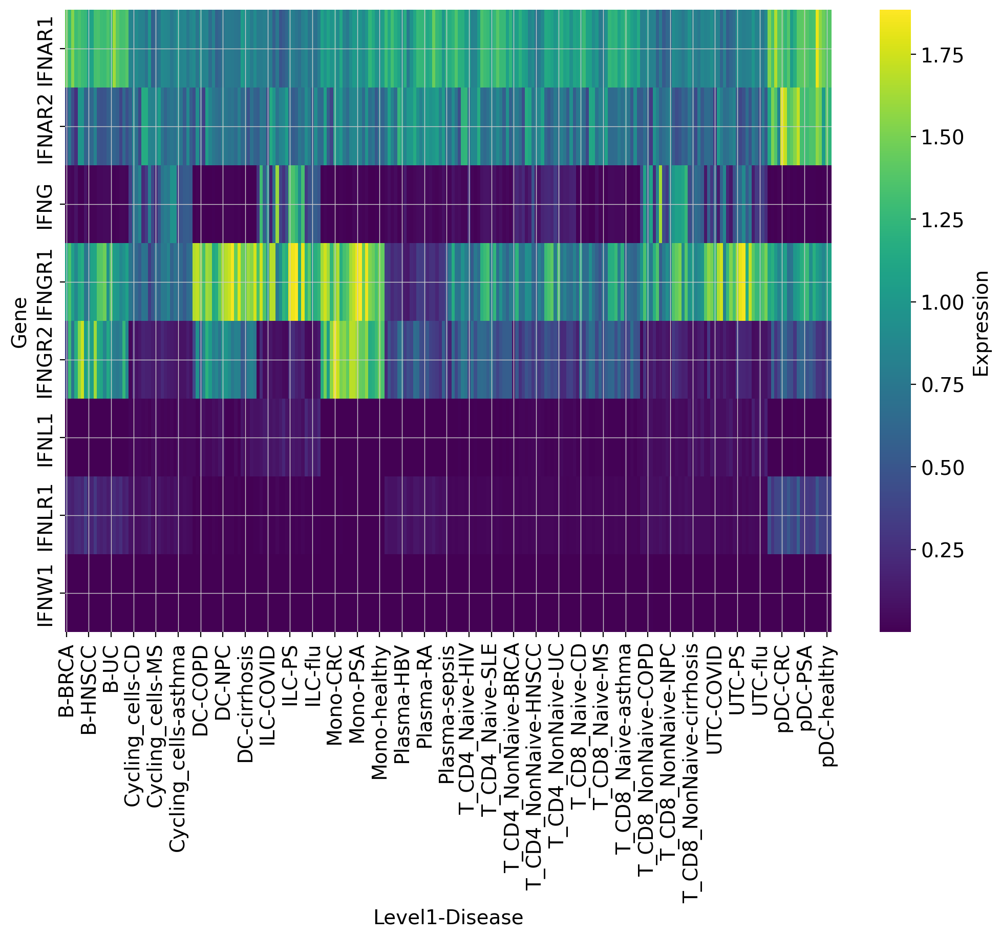

In [36]:
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_df, cmap='viridis', cbar=True, cbar_kws={'label': 'Expression'})
plt.show()

In [ ]:
for gene_symbol in ifn_genes.symbol.values:
    # Define the gene of interest
    gene_of_interest = varDF.index[varDF['symbol'] == gene_symbol][0]
    
    # Initialize lists to store data
    level1_categories = []
    disease_values = []
    expression_values = []
    
    # Iterate over each cell type
    for celltype, adata in cts_adata.items():
        # Check if the gene of interest is present in the var_names
        if gene_of_interest in adata.var_names:
            # Filter cells expressing the gene of interest
            adata_subset = adata[:, adata.var_names == gene_of_interest]
            
            # Check if the subset is not empty
            if adata_subset.shape[0] > 0:
                # Extract the expression values, level1 categories, and disease values
                expression_values.extend(adata_subset.X.flatten())
                level1_categories.extend(adata_subset.obs["Level1"].values)
                disease_values.extend(adata_subset.obs["disease"].values)
    # Create a DataFrame
    df = pd.DataFrame({"Level1": level1_categories, "Disease": disease_values, "Expression": expression_values})
    
    # Plot Violin plot
    plt.figure(figsize=(12, 8))
    sns.violinplot(data=df, x="Level1", y="Expression", hue="Disease", split=True, inner="quart")
    plt.title(gene_symbol)
    plt.xlabel("Level1 category")
    plt.ylabel("Expression")
    plt.xticks(rotation=45)
    plt.show()

In [32]:
adata

AnnData object with n_obs × n_vars = 7033 × 8253
    obs: 'studyID', 'libraryID', 'sampleID', 'chemistry', 'disease', 'sex', 'binned_age', 'Level1', 'Level2'
    var: 'mean', 'std'
    uns: 'log1p'
    layers: 'scANVI_correct_expr_scaled'

In [35]:
max(expression_values)

141.68983

In [27]:
len(cts_adata.keys())

13

In [37]:
# Gene symbol of interest
variable = "Level1"
for gene_symbol in ifn_genes.symbol.values: 
    # Get the corresponding ensembl gene ID
    gene_of_interest = varDF.index[varDF['symbol'] == gene_symbol][0]
    
    # Initialize lists to store data
    level1_categories = []
    disease_values = []
    expression_values = []
    
    # Iterate over each cell type
    for i, (celltype, adata) in enumerate(cts_adata.items()):
        # Exclude "Progenitors"
        if celltype != "Progenitors":
            # Check if the gene of interest is present in the var_names
            if gene_of_interest in adata.var_names:
                # Filter cells expressing the gene of interest
                adata_subset = adata[:, adata.var_names == gene_of_interest]
                
                # Check if the subset is not empty
                if adata_subset.shape[0] > 0:
                    # Extract the expression values, level1 categories, and disease values
                    expression_values.extend(adata_subset.X.flatten())
                    level1_categories.extend(adata_subset.obs[variable].values)
                    disease_values.extend(adata_subset.obs["disease"].values)
    df = pd.DataFrame({"Level1": level1_categories, "Disease": disease_values, "Expression": expression_values})


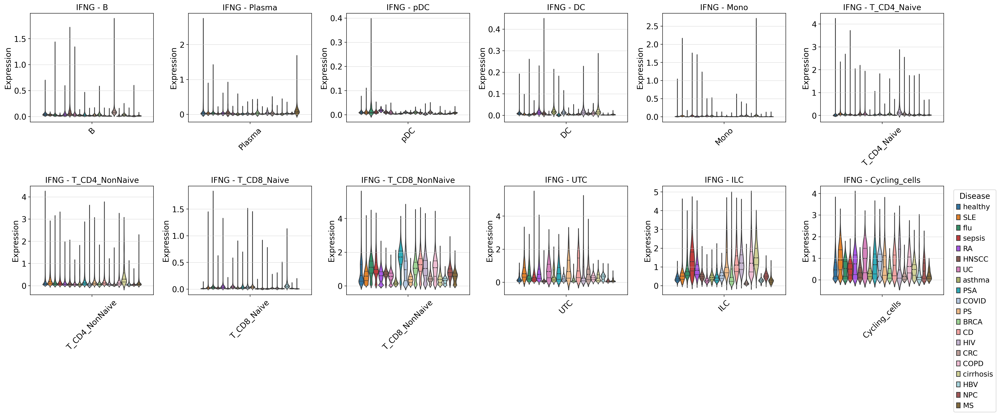

In [43]:
# Create subplots
fig, axs = plt.subplots(2, 6, figsize=(25, 10))  # 2 rows, 6 columns

# Initialize a variable to track the last subplot
last_subplot = None

# Iterate over each cell type
for i, (celltype, adata) in enumerate(cts_adata.items()):
    # Exclude "Progenitors"
    if celltype != "Progenitors":
        # Filter data for the current cell type
        df_celltype = df[df[variable] == celltype]
        
        # Plot Violin plot
        sns.violinplot(data=df_celltype, x="Level1", y="Expression", hue="Disease", ax=axs[i // 6, i % 6], split=False, inner="quart")
        axs[i // 6, i % 6].set_title("{} - {}".format(gene_symbol, celltype))
        axs[i // 6, i % 6].set_xlabel("")
        axs[i // 6, i % 6].set_ylabel("Expression")
        axs[i // 6, i % 6].tick_params(axis='x', rotation=45)
        
        # Remove legend from all subplots except the last one
        if i != len(cts_adata) - 2:
            axs[i // 6, i % 6].get_legend().remove()
        else:
            last_subplot = axs[i // 6, i % 6]

# Move the legend outside the last plot
last_subplot.legend(title="Disease", bbox_to_anchor=(1.05, 1), loc='upper left')

# Adjust layout
plt.tight_layout()
plt.show()


In [46]:
heatmap_df

Disease,BRCA,CD,COPD,COVID,CRC,HBV,HIV,HNSCC,MS,NPC,PS,PSA,RA,SLE,UC,asthma,cirrhosis,flu,healthy,sepsis
Level1,,,,,,,,,,,,,,,,,,,,
B,0.020526,0.042904,0.027561,0.088940,0.014601,0.012525,0.101140,0.020651,0.018125,0.016805,0.037475,0.040889,0.045456,0.047303,0.036428,0.013190,0.018179,0.034857,0.033299,0.029399
Cycling_cells,0.359882,0.730775,0.717248,0.841494,0.222865,0.326585,0.803694,0.390640,0.229970,0.477837,0.735154,0.798868,0.761118,0.954309,0.952622,0.367068,0.497130,0.539255,0.550761,0.511691
DC,0.002231,0.019938,0.007036,0.010968,0.003132,0.004125,0.012233,0.004847,0.003910,0.001952,0.021278,0.015442,0.017712,0.010891,0.021499,0.002971,0.003743,0.007393,0.005568,0.005031
ILC,0.280818,1.296497,0.561894,0.912099,0.158577,0.665457,1.595752,0.389241,0.272186,0.471712,1.368033,1.348274,1.249520,0.907314,1.319487,0.322684,0.459424,0.537288,0.555631,0.494643
Mono,0.003127,0.024604,0.012164,0.014657,0.002704,0.003060,0.021579,0.009149,0.006795,0.002692,0.034633,0.025030,0.029473,0.015951,0.032080,0.006591,0.005609,0.007827,0.008661,0.008492
Plasma,0.026671,0.061069,0.024776,0.057100,0.012066,0.022216,0.128519,0.023503,0.017156,0.030374,0.046837,0.056592,0.046402,0.041442,0.057480,0.028863,0.015138,0.033254,0.074718,0.023970
T_CD4_Naive,0.026656,0.100278,0.053670,0.063605,0.031551,0.030107,0.238617,0.028062,0.014686,0.024243,0.083519,0.097927,0.101523,0.073978,0.095235,0.041627,0.069720,0.025717,0.039298,0.021229
T_CD4_NonNaive,0.102595,0.215863,0.155790,0.226852,0.082440,0.141122,0.490314,0.121565,0.075158,0.188979,0.206951,0.226525,0.193938,0.325817,0.222293,0.124811,0.142816,0.133720,0.170675,0.182587
T_CD8_Naive,0.011035,0.050579,0.024615,0.035633,0.011636,0.008660,0.078995,0.020887,0.009042,0.013044,0.048784,0.046117,0.043281,0.043246,0.049451,0.014133,0.019195,0.014527,0.026274,0.013125


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Pivot the DataFrame
heatmap_df = df.pivot_table(index='Level1', columns=['Disease'], values='Expression', aggfunc='mean')

# Define the cell types
cell_types = list(cts_adata.keys())

# Calculate the number of rows and columns for the subplots
num_cols = len(heatmap_df.columns)
num_rows = len(cell_types)

# Create the heatmap with subplots
fig, axs = plt.subplots(num_rows, num_cols, figsize=(num_cols * 4, num_rows * 3), sharex=True)

# Iterate over each cell type
for i, celltype in enumerate(cell_types):
    # Create a heatmap for the current cell type
    sns.heatmap(heatmap_df, ax=axs[i], cmap='viridis', cbar=True, cbar_kws={'label': 'Expression'}, annot=True, fmt=".2f")
    
    # Add a white space between cell type heatmaps
    axs[i].axhline(y=0, color='white', linewidth=3)
    
    # Add cell type annotation at the top of the heatmap
    axs[i].set_title(celltype, loc='right', fontsize=14)

# Set common X label
fig.text(0.5, 0.04, 'Disease', ha='center', fontsize=16)

# Adjust layout
plt.tight_layout()
plt.show()


# Compute signatures

## Load objects

**Load adata**

In [18]:
sig_gs_ensg = IFN_gs
del sig_gs_ensg["v1_signatures"]

In [19]:
cts_adata = {}
for celltype in ['B', 'Plasma', 'pDC', 'DC', 'Mono', 'T_CD4_Naive', 'T_CD4_NonNaive', 'T_CD8_Naive', 'T_CD8_NonNaive', 'UTC','ILC', 'Cycling_cells', 'Progenitors']:
#for celltype in ["ILC", "Mono", 'B', 'T_CD4_NonNaive', 'T_CD8_NonNaive', 'Plasma','pDC', 'DC']:
    print(celltype)
    inputfile_path = here("03_downstream_analysis/04_integration_with_annotation/results/normalized_adatas_nextflow/cellType_adata_merged/{}_adataMerged.log1p.h5ad".format(celltype))
    # Loading scanpy (Anndata) object
    adata_cell = sc.read_h5ad(inputfile_path)
    # Loading
    adata_cell.layers["scANVI_correct_expr_scaled"] = adata_cell.X.copy()
    #zscaling
    sc.pp.scale(adata_cell, layer="scANVI_correct_expr_scaled")
    adata_cell.X = adata_cell.layers["scANVI_correct_expr_scaled"]   
    cts_adata[celltype] = adata_cell

B
Plasma
pDC
DC
Mono
T_CD4_Naive
T_CD4_NonNaive
T_CD8_Naive
T_CD8_NonNaive
UTC
ILC
Cycling_cells
Progenitors


## Check expression of IFNA and IFNB1

## Generate MLM input

In [21]:
def remove_nan_from_dict(dictionary):
    return {key: [value for value in values if not pd.isna(value)] for key, values in dictionary.items()}
sig_gs_ensg = remove_nan_from_dict(sig_gs_ensg)

In [22]:
def check_duplicates(dictionary):
    for key, value in dictionary.items():
        if len(value) != len(set(value)):
            duplicates = [item for item in value if value.count(item) > 1]
            return key, duplicates[0]  # Returning the key and the first duplicated gene found
    return None, None  # Return None if no duplicates found

# Check for duplicates
key, duplicate_gene = check_duplicates(sig_gs_ensg)
if duplicate_gene:
    print(f"Duplicate gene '{duplicate_gene}' found in list '{key}'.")
else:
    print("No duplicates found in any list.")

No duplicates found in any list.


In [23]:
data = []
for source, targets in sig_gs_ensg.items():
    for target in targets:
        data.append({'source': source, 'target': target, 'weight': 1})
geneWeights_netDF = pd.DataFrame(data)

## Run ULM

In [24]:
cts_adata.keys()

dict_keys(['B', 'Plasma', 'pDC', 'DC', 'Mono', 'T_CD4_Naive', 'T_CD4_NonNaive', 'T_CD8_Naive', 'T_CD8_NonNaive', 'UTC', 'ILC', 'Cycling_cells', 'Progenitors'])

In [25]:
for celltype, adata in cts_adata.items():
    print(celltype)
    # Select relevant rows from geneWeights_netDF
    netDF = geneWeights_netDF[geneWeights_netDF['source'].str.contains("_" + celltype) | geneWeights_netDF['source'].isin(['v2_signatures'])]
    # Run ulm
    dc.run_ulm(
        mat=adata,
        net=netDF,
        source='source',
        target='target',
        weight='weight',
        verbose=True,
        use_raw=False,
        min_n=5
    )
    # Update adata in cts_adata
    cts_adata[celltype] = adata

B
Running ulm on mat with 356874 samples and 8253 targets for 2 sources.
Plasma
Running ulm on mat with 16854 samples and 8253 targets for 2 sources.
pDC
Running ulm on mat with 22902 samples and 8253 targets for 2 sources.
DC
Running ulm on mat with 47076 samples and 8253 targets for 2 sources.
Mono
Running ulm on mat with 1049149 samples and 8253 targets for 2 sources.
T_CD4_Naive
Running ulm on mat with 792955 samples and 8253 targets for 2 sources.
T_CD4_NonNaive
Running ulm on mat with 712248 samples and 8253 targets for 2 sources.
T_CD8_Naive
Running ulm on mat with 213776 samples and 8253 targets for 2 sources.
T_CD8_NonNaive
Running ulm on mat with 523322 samples and 8253 targets for 2 sources.
UTC
Running ulm on mat with 115097 samples and 8253 targets for 1 sources.
ILC
Running ulm on mat with 376885 samples and 8253 targets for 2 sources.
Cycling_cells
Running ulm on mat with 45181 samples and 8253 targets for 1 sources.
Progenitors
Running ulm on mat with 7033 samples and 8

### Save objects with signatures

# Compare signatures

**Load objects with computed signatures**

In [ ]:
cts_adata = {}
for celltype in ['B', 'Plasma', 'pDC', 'DC', 'Mono', 'T_CD4_Naive', 'T_CD4_NonNaive', 'T_CD8_Naive', 'T_CD8_NonNaive', 'UTC','ILC', 
                 #'Cycling_cells', 'Progenitors'
                ]:
#for celltype in ["ILC", "Mono", 'B', 'T_CD4_NonNaive', 'T_CD8_NonNaive', 'Plasma','pDC', 'DC']:
    print(celltype)
    inputfile_path = here('03_downstream_analysis/06_inflammation_signatures/results/DecoupleR_ulmestimates_{}.h5ad'.format(celltype))
    # Loading scanpy (Anndata) object
    adata_cell = sc.read_h5ad(inputfile_path)   
    cts_adata[celltype] = adata_cell

# Activity per donor

In [91]:
adata

AnnData object with n_obs × n_vars = 22902 × 8253
    obs: 'studyID', 'libraryID', 'sampleID', 'chemistry', 'disease', 'sex', 'binned_age', 'Level1', 'Level2'
    var: 'mean', 'std'
    uns: 'log1p'
    obsm: 'ulm_estimate', 'ulm_pvals'
    layers: 'scANVI_correct_expr_scaled'

In [93]:
subtypes_dict = {
    "B": ["B_Transitional", "B_Naive", "B_Naive_activated", "B_Memory_ITGAX"], 
    "T_CD4_NonNaive": ["T_CD4_EM"], 
    "T_CD8_NonNaive": ["T_CD8_EM_CX3CR1int", "T_CD8_EM_CX3CR1high"], 
    "Plasma": ["Plasma_IGHG", "Plasma_XBP1"], 
    "Mono": "", 
    "DC": ["cDC2", "cDC3", "DC5"], 
    "pDC": "pDC",    
    "ILC": "",     
}
#for celltype in ["Mono", 'B', 'T_CD4_NonNaive', 'T_CD8_NonNaive', 'Plasma','pDC', 'DC']:

## Studies

In [ ]:
adata = cts_adata[celltype]
# Subset adata to disease == "SLE"
adata_celltype = adata[(adata.obs['disease'] == 'SLE')]
# Obtain activities
estimate_df = adata_celltype.obsm['ulm_estimate']

# Obtain important obs
subset_obs = adata_celltype.obs[['sampleID', 'disease', 'studyID','Level2']]

# Concatenate estimate_df and subset_obs
subset_df = pd.concat([estimate_df, subset_obs], axis=1)
subset_df.columns = [col.replace("_" + celltype, "") for col in subset_df.columns]
signature = next((col for col in subset_df.columns if re.fullmatch(pattern, col)), None)
mean_activity = subset_df.groupby('sampleID')[signature].mean().reset_index()
mean_activity

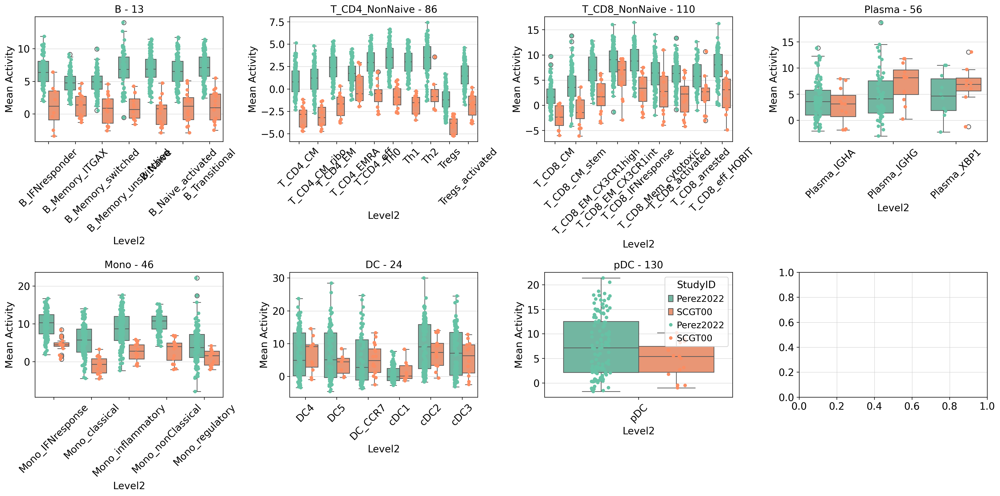

In [149]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define the patterns
pattern = "\\d+"
# Set up the subplots
fig, axes = plt.subplots(2, 4, figsize=(20, 10))
fig.subplots_adjust(wspace=0.5, hspace=0.5)

# Initialize a dictionary to store studyID-color mappings
studyID_colors = {}
# Initialize a variable to keep track of the last subplot
last_subplot = None

# Iterate over each celltype
for idx, (celltype, subtypes) in enumerate(subtypes_dict.items()):
    adata = cts_adata[celltype]
    # Subset adata to disease == "SLE"
    adata_celltype = adata[(adata.obs['disease'] == 'SLE')]
    # Obtain activities
    estimate_df = adata_celltype.obsm['ulm_estimate']
    
    # Obtain important obs
    subset_obs = adata_celltype.obs[['sampleID', 'disease', 'studyID','Level2']]
    
    # Concatenate estimate_df and subset_obs
    subset_df = pd.concat([estimate_df, subset_obs], axis=1)
    subset_df.columns = [col.replace("_" + celltype, "") for col in subset_df.columns]
    
    # Generate plots
    signature = next((col for col in subset_df.columns if re.fullmatch(pattern, col)), None)
    if signature:
        # Calculate mean activity per sample and studyID
        mean_activity = subset_df.groupby(['Level2', 'sampleID', 'studyID'])[signature].mean().reset_index()
        mean_activity = mean_activity.dropna(subset=[signature])

        # Determine the position of the subplot
        row = idx // 4
        col = idx % 4
        # Create the plot in the appropriate subplot
        ax = axes[row, col]
        
        # Assign unique color to each studyID and store in the studyID_colors dictionary
        for studyID in mean_activity['studyID'].unique():
            if studyID not in studyID_colors:
                studyID_colors[studyID] = sns.color_palette('Set2')[len(studyID_colors)]
        
        # Plot the boxplot with consistent studyID colors
        sns.boxplot(x='Level2', y=signature, hue='studyID', data=mean_activity, palette=studyID_colors, ax=ax)
        sns.stripplot(x='Level2', y=signature, hue='studyID', data=mean_activity, palette=studyID_colors, dodge=True, jitter=True, size=5, ax=ax)
        ax.set_title(f'{celltype} - {signature}')
        ax.set_xlabel('Level2')
        ax.set_ylabel('Mean Activity')
        # Rotate x-axis labels
        ax.tick_params(axis='x', rotation=45)
        
        # Remove legend from all plots except the last one
        if idx != len(subtypes_dict) - 1:
            ax.get_legend().remove()
        else:
            # Store the last subplot
            last_subplot = ax

# Show legend only for the last subplot
if last_subplot:
    last_subplot.legend(title='StudyID')

# Adjust layout
plt.tight_layout()
plt.show()


## Treated vs NonTreated

In [164]:
import pickle

# Load the pickle file
with open(here('00_data_processing/results/study_metadata/SCGT00_patient_metadata.pkl'), 'rb') as file:
    SCG_data = pickle.load(file)

In [165]:
SCG_data.head()

,patientID,timepoint_replicate,old_sample_id,disease,treatmentStatus,therapyResponse,sex,age,BMI,smokingStatus
sampleID,,,,,,,,,,
SCGT00_I57.3P_T0,SCGT00_I57,0,I005-00007,RA,antiIL6,NR,Female,47.0,25.7116620752984,non-smoker
SCGT00_I56.3P_T0,SCGT00_I56,0,I005-00006,RA,antiIL6,R,Female,56.0,30.1102788964583,non-smoker
SCGT00_I53.3P_T0,SCGT00_I53,0,I005-00003,RA,antiIL6,R,Female,69.0,25.0,non-smoker
SCGT00_I52.3P_T0,SCGT00_I52,0,I005-00002,RA,antiIL6,NR,Female,33.0,21.3675213675214,non-smoker
SCGT00_I51.3P_T0,SCGT00_I51,0,I005-00001,RA,antiIL6,R,Female,42.0,24.3417582863402,non-smoker


In [167]:
SLE_SCG_data = obs_data[(obs_data['disease'] == 'SLE') & obs_data.index.isin(cts_adata["B"].obs.sampleID)]
SLE_SCG_data.reset_index(inplace=True)
SLE_SCG_data.rename(columns={'index': 'sampleID'}, inplace=True)
SLE_SCG_data

,sampleID,patientID,timepoint_replicate,old_sample_id,disease,treatmentStatus,therapyResponse,sex,age,BMI,smokingStatus
0,SCGT00_I0149.3P_T0,SCGT00_I0149,0,I014-00009,SLE,AntiBlyS/BAFF,R,Female,43.0,23.3843537414966,non-smoker
1,SCGT00_I0141.3P_T0,SCGT00_I0141,0,I014-00001,SLE,AntiBlyS/BAFF,NR,Female,23.0,20.077747874749,non-smoker
2,SCGT00_I0145.3P_T0,SCGT00_I0145,0,I014-00005,SLE,AntiBlyS/BAFF,NR,Female,28.0,18.1662042541947,non-smoker
3,SCGT00_I0148.3P_T0,SCGT00_I0148,0,I014-00008,SLE,AntiBlyS/BAFF,R,Female,36.0,25.390625,smoker
4,SCGT00_I0143.3P_T0,SCGT00_I0143,0,I014-00003,SLE,AntiBlyS/BAFF,NR,Female,43.0,29.3480257116621,non-smoker
5,SCGT00_I0144.3P_T0,SCGT00_I0144,0,I014-00004,SLE,AntiBlyS/BAFF,R,Female,29.0,38.257130106698,non-smoker
6,SCGT00_I014011.3P_T0,SCGT00_I014011,0,I014-00011,SLE,AntiBlyS/BAFF,R,Female,62.0,28.8888888888889,non-smoker
7,SCGT00_I0142.3P_T0,SCGT00_I0142,0,I014-00002,SLE,AntiBlyS/BAFF,NR,Female,57.0,20.5761316872428,non-smoker
8,SCGT00_I0146.3P_T0,SCGT00_I0146,0,I014-00006,SLE,AntiBlyS/BAFF,NR,Female,42.0,27.4348422496571,non-smoker
9,SCGT00_I014010.3P_T0,SCGT00_I014010,0,I014-00010,SLE,AntiBlyS/BAFF,NR,Female,50.7049965776865,24.092970521542,non-smoker


In [168]:
print(SLE_SCG_data.head())

             sampleID     patientID  timepoint_replicate old_sample_id  \
0  SCGT00_I0149.3P_T0  SCGT00_I0149                    0    I014-00009   
1  SCGT00_I0141.3P_T0  SCGT00_I0141                    0    I014-00001   
2  SCGT00_I0145.3P_T0  SCGT00_I0145                    0    I014-00005   
3  SCGT00_I0148.3P_T0  SCGT00_I0148                    0    I014-00008   
4  SCGT00_I0143.3P_T0  SCGT00_I0143                    0    I014-00003   

  disease treatmentStatus therapyResponse     sex   age               BMI  \
0     SLE   AntiBlyS/BAFF               R  Female  43.0  23.3843537414966   
1     SLE   AntiBlyS/BAFF              NR  Female  23.0   20.077747874749   
2     SLE   AntiBlyS/BAFF              NR  Female  28.0  18.1662042541947   
3     SLE   AntiBlyS/BAFF               R  Female  36.0         25.390625   
4     SLE   AntiBlyS/BAFF              NR  Female  43.0  29.3480257116621   

  smokingStatus  
0    non-smoker  
1    non-smoker  
2    non-smoker  
3        smoker  
4 

In [169]:
adata = cts_adata[celltype]
adata_celltype = adata[(adata.obs['disease'] == 'SLE')]
estimate_df = adata_celltype.obsm['ulm_estimate']
subset_obs = adata_celltype.obs[['sampleID', 'disease', 'studyID','Level2']]
subset_df = pd.concat([estimate_df, subset_obs], axis=1)
subset_df.columns = [col.replace("_" + celltype, "") for col in subset_df.columns]
signature = next((col for col in subset_df.columns if re.fullmatch(pattern, col)), None)
if signature:
    # Calculate mean activity per sample and studyID
    mean_activity = subset_df.groupby(['Level2', 'sampleID', 'studyID'])[signature].mean().reset_index()
mean_activity = mean_activity.dropna(subset=[signature])
mean_activity = mean_activity[mean_activity['studyID'] == 'SCGT00']
mean_activity = mean_activity.merge(SLE_SCG_data[['sampleID', 'therapyResponse']], on='sampleID', how='left')
mean_activity


,Level2,sampleID,studyID,130,therapyResponse
0,pDC,SCGT00_I0141.3P_T0,SCGT00,-0.503606,NR
1,pDC,SCGT00_I0142.3P_T0,SCGT00,8.915910,NR
2,pDC,SCGT00_I0144.3P_T0,SCGT00,-0.986526,R
3,pDC,SCGT00_I0145.3P_T0,SCGT00,-0.462376,NR
4,pDC,SCGT00_I0146.3P_T0,SCGT00,6.674197,NR
5,pDC,SCGT00_I0147.3P_T0,SCGT00,8.460857,NR
6,pDC,SCGT00_I0148.3P_T0,SCGT00,3.150470,R
7,pDC,SCGT00_I0149.3P_T0,SCGT00,5.028824,R
8,pDC,SCGT00_I014010.3P_T0,SCGT00,2.688433,NR
9,pDC,SCGT00_I014011.3P_T0,SCGT00,1.781412,R


In [ ]:
mean_activity

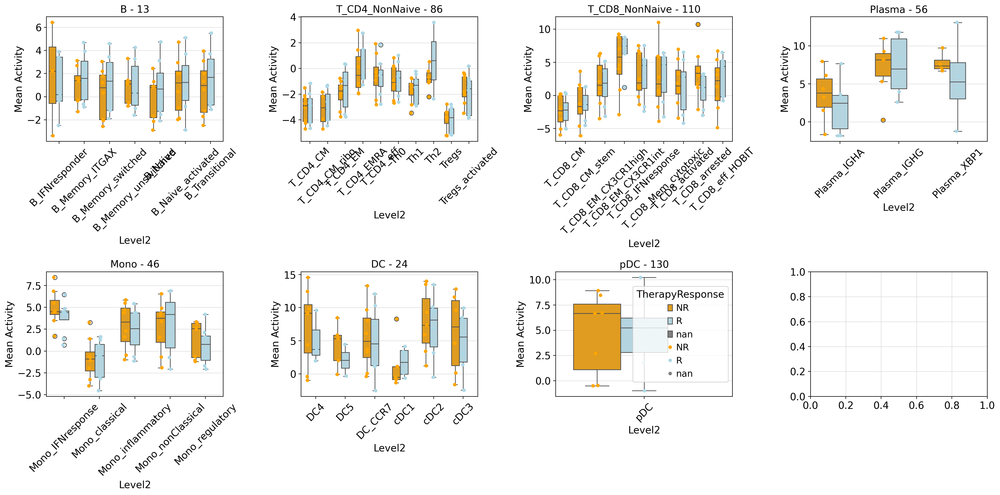

In [192]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define the patterns
pattern = "\\d+"
# Set up the subplots
fig, axes = plt.subplots(2, 4, figsize=(20, 10))
fig.subplots_adjust(wspace=0.5, hspace=0.5)

# Initialize a dictionary to store therapyResponse-color mappings
therapyResponse_colors = {'R': 'lightblue', 'NR': 'orange', 'nan': 'grey'}
# Initialize a variable to keep track of the last subplot
last_subplot = None

# Iterate over each celltype
for idx, (celltype, subtypes) in enumerate(subtypes_dict.items()):
    adata = cts_adata[celltype]
    adata_celltype = adata[(adata.obs['disease'] == 'SLE')]
    estimate_df = adata_celltype.obsm['ulm_estimate']
    subset_obs = adata_celltype.obs[['sampleID', 'disease', 'studyID','Level2']]
    subset_df = pd.concat([estimate_df, subset_obs], axis=1)
    subset_df.columns = [col.replace("_" + celltype, "") for col in subset_df.columns]
    signature = next((col for col in subset_df.columns if re.fullmatch(pattern, col)), None)
    if signature:
        # Calculate mean activity per sample and studyID
        mean_activity = subset_df.groupby(['Level2', 'sampleID', 'studyID'])[signature].mean().reset_index()
        mean_activity = mean_activity.dropna(subset=[signature])
        mean_activity = mean_activity[mean_activity['studyID'] == 'SCGT00']
        mean_activity = mean_activity.merge(SLE_SCG_data[['sampleID', 'therapyResponse']], on='sampleID', how='left')
        
        # Determine the position of the subplot
        row = idx // 4
        col = idx % 4
        # Create the plot in the appropriate subplot
        ax = axes[row, col]
        
        # Assign unique color to each therapyResponse and store in the therapyResponse_colors dictionary
        for therapyResponse in mean_activity['therapyResponse'].unique():
            if therapyResponse not in therapyResponse_colors:
                therapyResponse_colors[therapyResponse] = sns.color_palette('Set2')[len(therapyResponse_colors)]
        
        # Plot the boxplot with consistent therapyResponse colors
        sns.boxplot(x='Level2', y=signature, hue='therapyResponse', data=mean_activity, palette=therapyResponse_colors, ax=ax)
        sns.stripplot(x='Level2', y=signature, hue='therapyResponse', data=mean_activity, palette=therapyResponse_colors, dodge=True, jitter=True, size=5, ax=ax)
        ax.set_title(f'{celltype} - {signature}')
        ax.set_xlabel('Level2')
        ax.set_ylabel('Mean Activity')
        # Rotate x-axis labels
        ax.tick_params(axis='x', rotation=45)
        
        # Remove legend from all plots except the last one
        if idx != len(subtypes_dict) - 1:
            ax.get_legend().remove()
        else:
            # Store the last subplot
            last_subplot = ax

# Show legend only for the last subplot
if last_subplot:
    last_subplot.legend(title='TherapyResponse')

# Adjust layout
plt.tight_layout()
plt.show()


## Flare vs NonFlare

In [187]:

adata = cts_adata[celltype]
adata_celltype = adata[(adata.obs['disease'] == 'SLE')]
estimate_df = adata_celltype.obsm['ulm_estimate']
subset_obs = adata_celltype.obs[['sampleID', 'disease', 'studyID','Level2']]
subset_df = pd.concat([estimate_df, subset_obs], axis=1)
subset_df.columns = [col.replace("_" + celltype, "") for col in subset_df.columns]
signature = next((col for col in subset_df.columns if re.fullmatch(pattern, col)), None)
# Calculate mean activity per sample and studyID
mean_activity = subset_df.groupby(['Level2', 'sampleID', 'studyID'])[signature].mean().reset_index()
mean_activity = mean_activity.dropna(subset=[signature])
mean_activity = mean_activity[mean_activity['studyID'] == 'Perez2022']
mean_activity['Flare'] = np.where(mean_activity['sampleID'].str.contains('FLARE', case=False, na=False), 'F', 'Not_F')
mean_activity.head()



,Level2,sampleID,studyID,130,Flare
0,pDC,Perez2022_1004_T0,Perez2022,2.163710,Not_F
2,pDC,Perez2022_1014_T0,Perez2022,6.252144,Not_F
4,pDC,Perez2022_1015_T0,Perez2022,7.938739,Not_F
6,pDC,Perez2022_1019_T0,Perez2022,-1.087181,Not_F
8,pDC,Perez2022_1046_T0,Perez2022,7.794142,Not_F


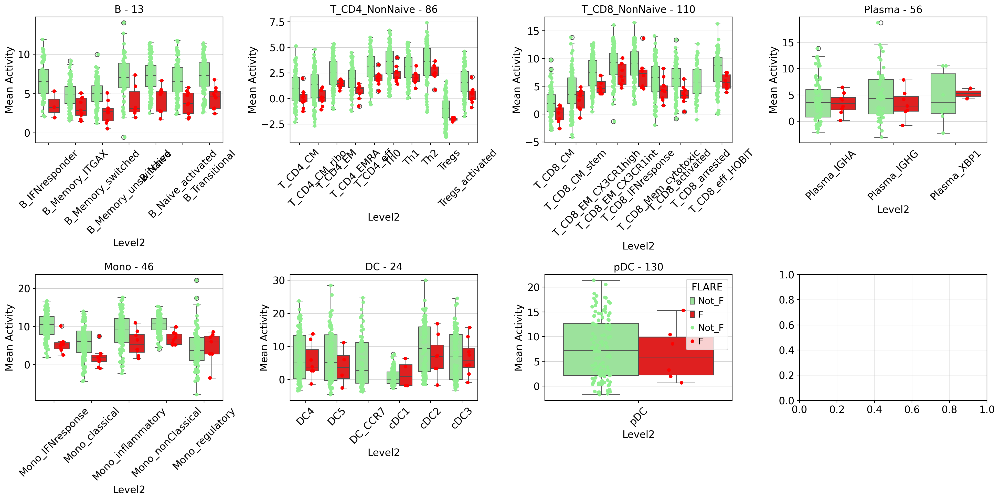

In [190]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define the patterns
pattern = "\\d+"
# Set up the subplots
fig, axes = plt.subplots(2, 4, figsize=(20, 10))
fig.subplots_adjust(wspace=0.5, hspace=0.5)

# Initialize a dictionary to store therapyResponse-color mappings
therapyResponse_colors = {'F': 'red', 'Not_F': 'lightgreen', 'nan': 'grey'}
# Initialize a variable to keep track of the last subplot
last_subplot = None

# Iterate over each celltype
for idx, (celltype, subtypes) in enumerate(subtypes_dict.items()):
    adata = cts_adata[celltype]
    adata_celltype = adata[(adata.obs['disease'] == 'SLE')]
    estimate_df = adata_celltype.obsm['ulm_estimate']
    subset_obs = adata_celltype.obs[['sampleID', 'disease', 'studyID','Level2']]
    subset_df = pd.concat([estimate_df, subset_obs], axis=1)
    subset_df.columns = [col.replace("_" + celltype, "") for col in subset_df.columns]
    signature = next((col for col in subset_df.columns if re.fullmatch(pattern, col)), None)
    if signature:
        # Calculate mean activity per sample and studyID
        mean_activity = subset_df.groupby(['Level2', 'sampleID', 'studyID'])[signature].mean().reset_index()
        mean_activity = mean_activity.dropna(subset=[signature])
        mean_activity = mean_activity[mean_activity['studyID'] == 'Perez2022']
        mean_activity['Flare'] = np.where(mean_activity['sampleID'].str.contains('FLARE', case=False, na=False), 'F', 'Not_F')
        
        # Determine the position of the subplot
        row = idx // 4
        col = idx % 4
        # Create the plot in the appropriate subplot
        ax = axes[row, col]
                
        # Plot the boxplot with consistent therapyResponse colors
        sns.boxplot(x='Level2', y=signature, hue='Flare', data=mean_activity, palette=therapyResponse_colors, ax=ax)
        sns.stripplot(x='Level2', y=signature, hue='Flare', data=mean_activity, palette=therapyResponse_colors, dodge=True, jitter=True, size=5, ax=ax)
        ax.set_title(f'{celltype} - {signature}')
        ax.set_xlabel('Level2')
        ax.set_ylabel('Mean Activity')
        # Rotate x-axis labels
        ax.tick_params(axis='x', rotation=45)
        
        # Remove legend from all plots except the last one
        if idx != len(subtypes_dict) - 1:
            ax.get_legend().remove()
        else:
            # Store the last subplot
            last_subplot = ax

# Show legend only for the last subplot
if last_subplot:
    last_subplot.legend(title='FLARE')

# Adjust layout
plt.tight_layout()
plt.show()


# Session info

In [107]:
session_info.show()